In [1]:
## load useful libraries
suppressWarnings(suppressPackageStartupMessages(library(rhdf5)))
suppressWarnings(suppressPackageStartupMessages(library(qvalue)))
suppressWarnings(suppressPackageStartupMessages(library(dplyr)))
suppressWarnings(suppressPackageStartupMessages(library(cowplot)))
suppressWarnings(suppressPackageStartupMessages(library(tidyverse)))
suppressWarnings(suppressPackageStartupMessages(library(ggbeeswarm)))
suppressWarnings(suppressPackageStartupMessages(library(ggthemes)))
# suppressWarnings(suppressPackageStartupMessages(library(scater)))
suppressWarnings(suppressPackageStartupMessages(library(SingleCellExperiment)))
suppressWarnings(suppressPackageStartupMessages(library(edgeR)))
suppressWarnings(suppressPackageStartupMessages(library(limma)))
suppressWarnings(suppressPackageStartupMessages(library(ggplot2)))
suppressWarnings(suppressPackageStartupMessages(library(ISLR)))
suppressWarnings(suppressPackageStartupMessages(library(GGally)))
# suppressWarnings(suppressPackageStartupMessages(library(scran)))
suppressWarnings(suppressPackageStartupMessages(library(ComplexHeatmap)))
suppressWarnings(suppressPackageStartupMessages(library(circlize)))
suppressWarnings(suppressPackageStartupMessages(library(ComplexHeatmap)))
suppressWarnings(suppressPackageStartupMessages(library(Rtsne)))
suppressWarnings(suppressPackageStartupMessages(library(RColorBrewer)))

In [1]:
devtools::install_github("ropenscilabs/umapr")

from URL https://api.github.com/repos/ropenscilabs/umapr/zipball/master
Installing umapr
'/nfs/software/stegle/users/acuomo/conda-envs/myr/lib/R/bin/R' --no-site-file  \
  --no-environ --no-save --no-restore --quiet CMD INSTALL  \
  '/tmp/RtmpCDEoFf/devtools39f150bb936c/ropenscilabs-umapr-ca62144'  \
  --library='/nfs/software/stegle/users/acuomo/conda-envs/myr/lib/R/library'  \
  --install-tests 



In [2]:
library(umapr)
library(tidyverse)

── Attaching packages ─────────────────────────────────────── tidyverse 1.2.1 ──
✔ ggplot2 2.2.1     ✔ purrr   0.2.4
✔ tibble  1.4.2     ✔ dplyr   0.7.4
✔ tidyr   0.8.0     ✔ stringr 1.3.0
✔ readr   1.1.1     ✔ forcats 0.3.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


In [ ]:
##### sce before filtering out bad plates / batches

In [3]:
sce.beforefilt = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_beforefilt.rds")

In [4]:
sce.beforefilt

class: SingleCellExperiment 
dim: 11231 37607 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(37607): 20416_1#10 20416_1#11 ... 24539_8#97 24539_8#98
colData names(115): adj_x adj_y ... donor_short_id donor_long_id
reducedDimNames(1): PCA
spikeNames(1): ERCC

In [5]:
pca.beforefilt = prcomp(t(logcounts(sce.beforefilt)))

In [6]:
# summary(pca.beforefilt)

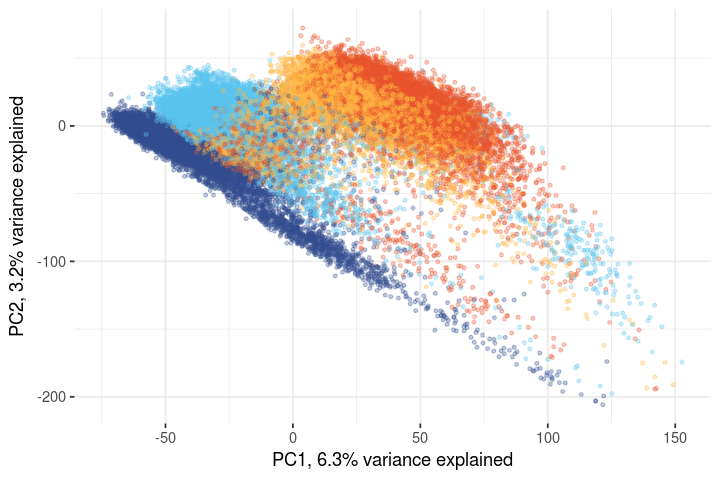

In [7]:
df = as.data.frame(cbind(pca.beforefilt$x[,1:2], sce.beforefilt$day))
perc_var <- round(summary(pca.beforefilt)$importance[2,]*100, 1)
options(repr.plot.width = 6, repr.plot.height = 4)
colnames(df)[3] <- "day"
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(day))) + 
        geom_point(alpha = 0.3, size = 0.8) + 
        scale_color_canva(palette = "Pool party") +
        theme_bw() + theme(legend.position = "none", panel.border = element_blank()) + 
        xlab(paste0("PC1, ",perc_var[1],"% variance explained")) +
        ylab(paste0("PC2, ",perc_var[2],"% variance explained"))

In [ ]:
## SCE set that we are currently using

In [2]:
sce = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_filt_allexpts.rds")

In [3]:
sce

class: SingleCellExperiment 
dim: 11231 36044 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(17): exprs_collapsed_to ensembl_transcript_id ...
  is_intop2000hvg is_hvg
colnames(36044): 21843_1#10 21843_1#100 ... 24539_8#97 24539_8#98
colData names(123): adj_x adj_y ... princ_curve princ_curve_scaled01
reducedDimNames(1): PCA
spikeNames(1): ERCC

In [10]:
pca = prcomp(t(logcounts(sce)))

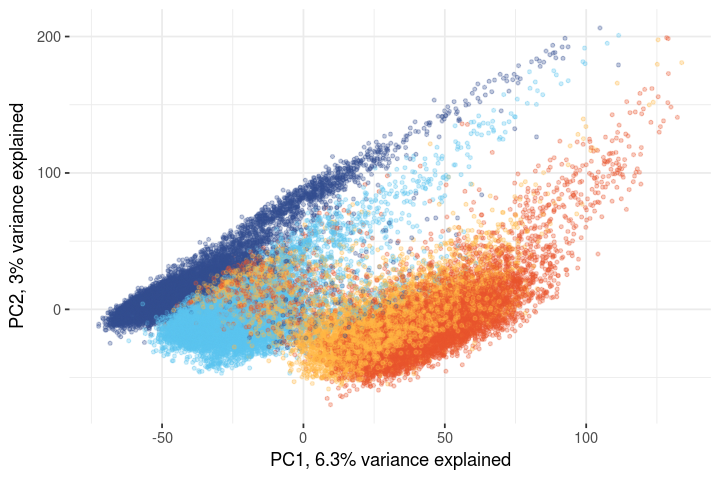

In [11]:
df = as.data.frame(cbind(pca$x[,1:2], sce$day))
perc_var <- round(summary(pca)$importance[2,]*100, 1)
options(repr.plot.width = 6, repr.plot.height = 4)
colnames(df)[3] <- "day"
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(day))) + 
        geom_point(alpha = 0.3, size = 0.8) + 
        scale_color_canva(palette = "Pool party") +
        theme_bw() + theme(legend.position = "none", panel.border = element_blank()) + 
        xlab(paste0("PC1, ",perc_var[1],"% variance explained")) +
        ylab(paste0("PC2, ",perc_var[2],"% variance explained"))

In [12]:
sce.slalom = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_filt_allexpts.slalom.is_intop2000hvg.rds")

In [13]:
nrow(sce.slalom)

[1] 1429

In [14]:
pca.slalom = prcomp(t(logcounts(sce.slalom)))

In [15]:
perc_var <- round(summary(pca.slalom)$importance[2,]*100, 1)
sum(perc_var[1:50])

[1] 39.1

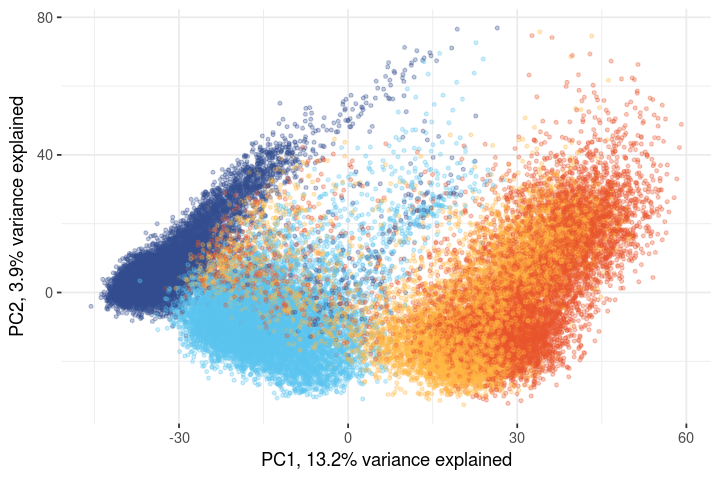

In [16]:
df = as.data.frame(cbind(pca.slalom$x[,1:2], sce.slalom$day))
perc_var <- round(summary(pca.slalom)$importance[2,]*100, 1)
options(repr.plot.width = 6, repr.plot.height = 4)
colnames(df)[3] <- "day"
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(day))) + 
        geom_point(alpha = 0.3, size = 0.8) + 
        scale_color_canva(palette = "Pool party") +
        theme_bw() + theme(legend.position = "none", panel.border = element_blank()) + 
        xlab(paste0("PC1, ",perc_var[1],"% variance explained")) +
        ylab(paste0("PC2, ",perc_var[2],"% variance explained"))

In [ ]:
set.seed(147)
tsne <- Rtsne(t(logcounts(sce.slalom)), pca = TRUE)
head(tsne$Y)

In [ ]:
df <- data.frame(comp1 = tsne$Y[,1], comp2 = tsne$Y[,2], day = sce.slalom$day)
ggplot(df, aes(x = comp1, y = comp2, colour = day)) + geom_point(alpha = 0.4) + 
        scale_color_canva(palette = "Pool party") +
        theme_bw() + theme(legend.position = "none", panel.border = element_blank())

In [ ]:
odd_cluster = which(tsne$Y[,1]>27 & tsne$Y[,1]<38 & tsne$Y[,2]>13 & tsne$Y[,2]<26)

In [ ]:
df <- data.frame(comp1 = tsne$Y[,1], comp2 = tsne$Y[,2], day = sce.slalom$day)
ggplot(df, aes(x = comp1, y = comp2, colour = day)) + geom_point(alpha = 0.4) + 
        scale_color_canva(palette = "Pool party") +
        theme_bw() + theme(legend.position = "none", panel.border = element_blank())+
        geom_point(aes(x = as.numeric(comp1), y = as.numeric(comp2)), 
                   data = df[odd_cluster,], col = "black", alpha = 0.6)

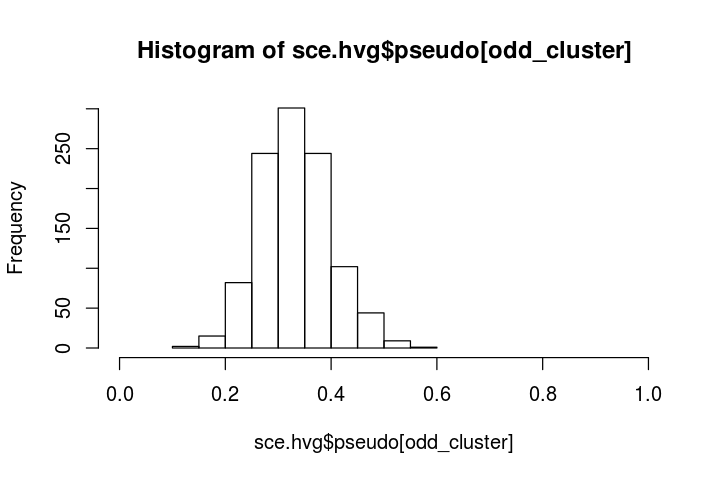

In [13]:
hist(sce.slalom$pseudo[odd_cluster], xlim = c(0,1))

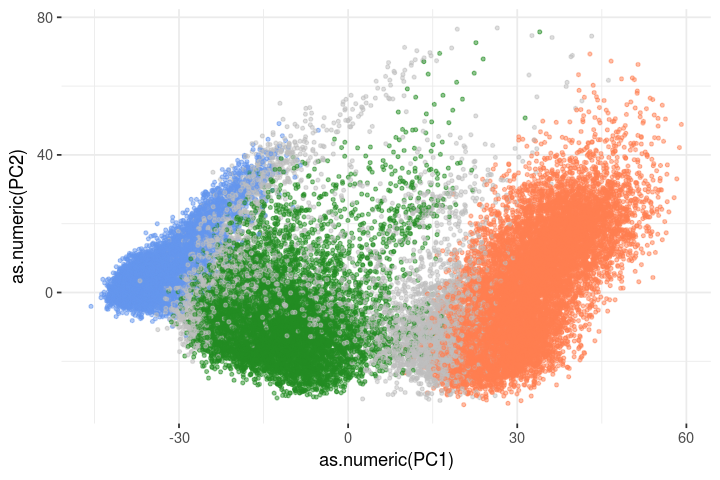

In [9]:
df = as.data.frame(cbind(pca.hvg$x[,1:2], sce.hvg$stage))
perc_var <- round(summary(pca.hvg)$importance[2,]*100, 1)
options(repr.plot.width = 6, repr.plot.height = 4)
colnames(df)[3] <- "stage"
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(stage))) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_colour_manual(values = c("coral","cornflowerblue","forestgreen","gray")) + 
        theme_bw() + theme(legend.position = "none", panel.border = element_blank()) 

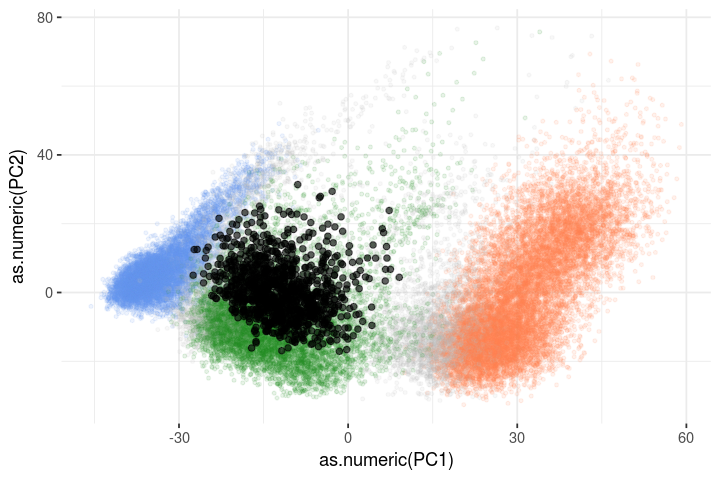

In [14]:
df = as.data.frame(cbind(pca.hvg$x[,1:2], sce.hvg$stage))
perc_var <- round(summary(pca.hvg)$importance[2,]*100, 1)
options(repr.plot.width = 6, repr.plot.height = 4)
colnames(df)[3] <- "day"
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(day))) + 
        geom_point(alpha = 0.1, size = 0.8) + 
        scale_colour_manual(values = c("coral","cornflowerblue","forestgreen","gray")) + 
        theme_bw() + theme(legend.position = "none", panel.border = element_blank()) +
        geom_point(aes(x = as.numeric(PC1), y = as.numeric(PC2)), 
                   data = df[odd_cluster,], col = "black",alpha = 0.6)

In [55]:
sce.hvg$odd_cluster_factor = as.factor((tsne$Y[,1]>27 & tsne$Y[,1]<38 & tsne$Y[,2]>13 & tsne$Y[,2]<26))
sum(sce.hvg$odd_cluster_factor == "TRUE")

[1] 1044

In [49]:
markerGenes <- findMarkers(counts(sce.hvg[,sce.hvg$day == "day1"]), 
                           cluster = sce.hvg[,sce.hvg$day == "day1"]$odd_cluster_factor, 
                           direction = "up")

In [58]:
head(markerGenes[["TRUE"]],15)

Top,Gene,FDR,logFC.FALSE
1,PPIAP22,3.594528e-192,54.9102982
2,JUN,1.362807e-64,6.4341023
3,FOS,1.825047e-38,60.0012474
4,PSPHP1,1.205477e-06,4.9136799
5,CYR61,8.154371e-06,16.7094135
6,GDF3,2.047021e-04,7.4084897
7,NR4A1,2.539169e-04,1.0779806
8,ATF3,4.210531e-03,1.2726450
9,UTRN,1.688428e-02,2.5402335
10,POU5F1,1.843737e-02,33.3827067


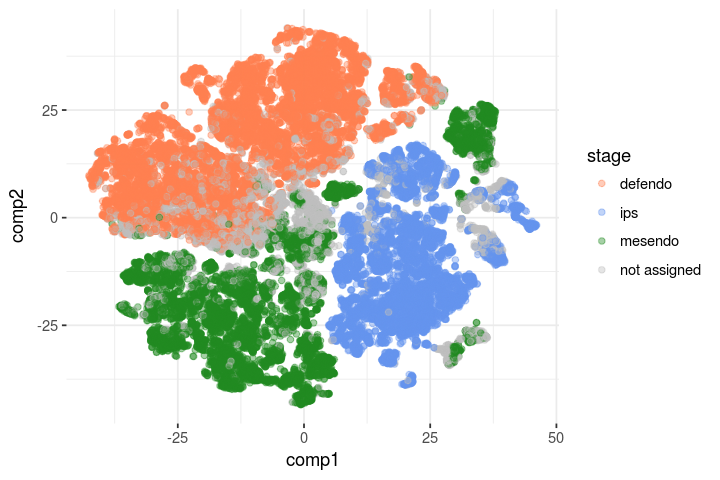

In [16]:
df <- data.frame(comp1 = tsne$Y[,1], comp2 = tsne$Y[,2], 
                 stage = sce.hvg$stage)
ggplot(df, aes(x = comp1, y = comp2, colour = stage)) + geom_point(alpha = 0.4) + 
        scale_colour_manual(values = c("coral","cornflowerblue","forestgreen","gray")) + 
        theme_bw() + theme(panel.border = element_blank())

In [19]:
# Ludovic Vallier's list of cell cycle genes
cellcycle_LV = c('ENSG00000105810_CDK6','ENSG00000110092_CCND1','ENSG00000112576_CCND3','ENSG00000118971_CCND2',
                'ENSG00000123374_CDK2','ENSG00000132646_PCNA','ENSG00000134057_CCNB1','ENSG00000135446_CDK4',
                'ENSG00000145386_CCNA2','ENSG00000148773_MKI67','ENSG00000157456_CCNB2','ENSG00000170312_CDK1',
                'ENSG00000111276_CDKN1B','ENSG00000124762_CDKN1A','ENSG00000129355_CDKN2D','ENSG00000129757_CDKN1C')

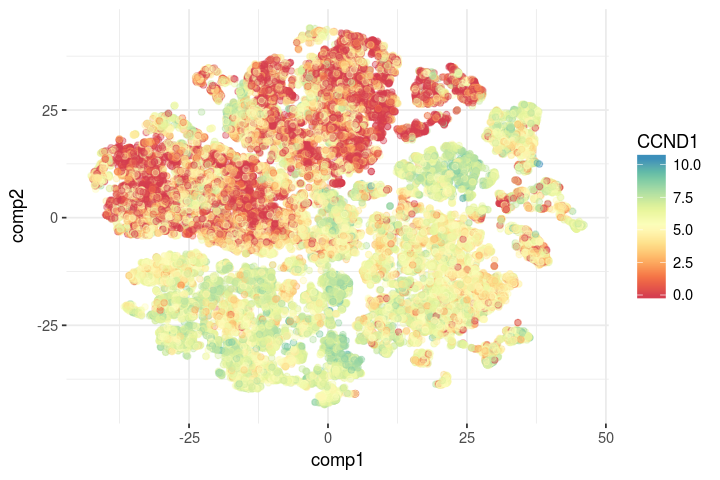

In [32]:
library(RColorBrewer)
df <- data.frame(comp1 = tsne$Y[,1], comp2 = tsne$Y[,2], 
                 stage = sce.hvg$stage)
df = cbind(df, as.data.frame(t(logcounts(sce.hvg[paste0(rowData(sce.hvg)$ensembl_gene_id,"_",rownames(sce.hvg)) %in% cellcycle_LV,]))))
# head(df)
ggplot(df, aes(x = comp1, y = comp2, colour = CCND1)) + geom_point(alpha = 0.4) + 
        scale_colour_gradientn(colors = brewer.pal("Spectral",n=9)) + 
        theme_bw() + theme(panel.border = element_blank())

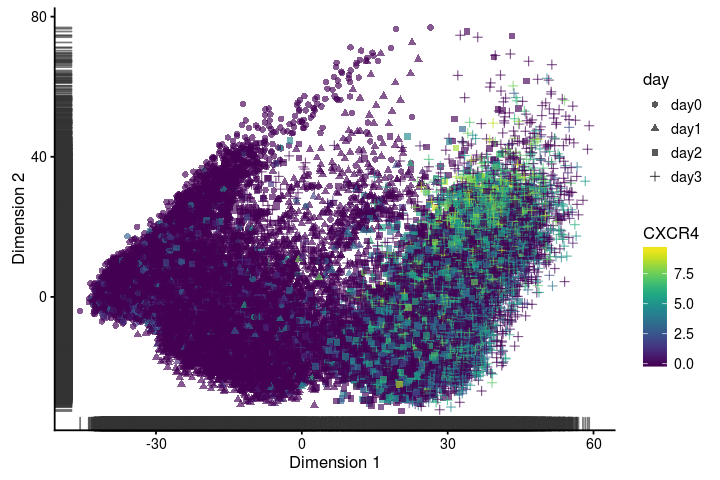

In [18]:
scater::plotPCA(sce.hvg, colour_by =  "CXCR4", shape_by = "day", ncomponents = 2) 

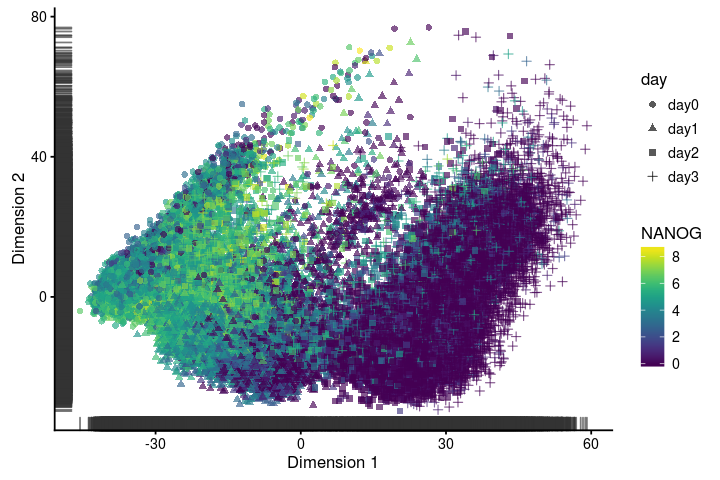

In [17]:
scater::plotPCA(sce.hvg, colour_by =  "NANOG", shape_by = "day", ncomponents = 2) 

In [60]:
## define known marker genes
pluri_markers <- c("ENSG00000111704_NANOG", "ENSG00000204531_POU5F1", "ENSG00000164362_TERT", "ENSG00000181449_SOX2",
                   "ENSG00000121570_DPPA4")
mesendo_markers <- c("ENSG00000164458_T", "ENSG00000163508_EOMES","ENSG00000185155_MIXL1")
defendo_markers <- c("ENSG00000121966_CXCR4", "ENSG00000136574_GATA4","ENSG00000141448_GATA6", "ENSG00000125798_FOXA2",
                     "ENSG00000164736_SOX17", "ENSG00000133937_GSC","ENSG00000147869_CER1", "ENSG00000132130_LHX1")
later_markers <- c("ENSG00000152804_HHEX", "ENSG00000170608_FOXA3")
diff_genes <- c(pluri_markers, mesendo_markers, defendo_markers, later_markers)

In [65]:
# library(RColorBrewer)
# display.brewer.all()

In [68]:
library(RColorBrewer)
df <- data.frame(comp1 = tsne$Y[,1], comp2 = tsne$Y[,2], 
                 stage = sce.hvg$stage)
df = cbind(df, as.data.frame(t(logcounts(sce.hvg[paste0(rowData(sce.hvg)$ensembl_gene_id,"_",rownames(sce.hvg)) %in% diff_genes,]))))
# head(df)
p1 = ggplot(df, aes(x = comp1, y = comp2, colour = NANOG)) + geom_point(alpha = 0.4) + 
        scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9)) + 
        theme_bw() + theme(panel.border = element_blank())
p2 = ggplot(df, aes(x = comp1, y = comp2, colour = T)) + geom_point(alpha = 0.4) + 
        scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9)) + 
        theme_bw() + theme(panel.border = element_blank())
p3 = ggplot(df, aes(x = comp1, y = comp2, colour = EOMES)) + geom_point(alpha = 0.4) + 
        scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9)) + 
        theme_bw() + theme(panel.border = element_blank())
p4 = ggplot(df, aes(x = comp1, y = comp2, colour = GATA6)) + geom_point(alpha = 0.4) + 
        scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9)) + 
        theme_bw() + theme(panel.border = element_blank())

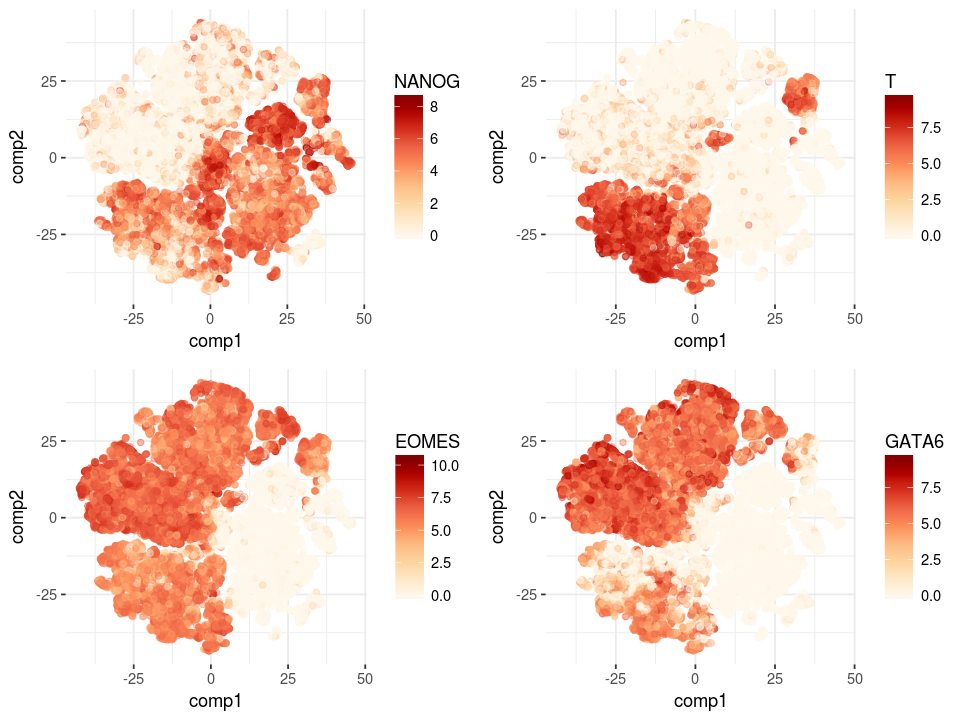

In [69]:
options(repr.plot.width = 8, repr.plot.height = 6)
plot_grid(p1,p2,p3,p4, ncol = 2)

In [75]:
df = as.data.frame(cbind(pca.hvg$x[,1:2], sce.hvg$stage))
perc_var <- round(summary(pca.hvg)$importance[2,]*100, 1)
df = cbind(df, as.data.frame(t(logcounts(sce.hvg[paste0(rowData(sce.hvg)$ensembl_gene_id,"_",rownames(sce.hvg)) %in% diff_genes,]))))
# head(df)
p1 = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = NANOG)) + geom_point(alpha = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9)) + 
        theme_bw() + theme(panel.border = element_blank()) + 
        xlab("PC1") + ylab("PC2")
p2 = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = T)) + geom_point(alpha = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9)) + 
        theme_bw() + theme(panel.border = element_blank()) + 
        xlab("PC1") + ylab("PC2")
p3 = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = EOMES)) + geom_point(alpha = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9)) + 
        theme_bw() + theme(panel.border = element_blank()) + 
        xlab("PC1") + ylab("PC2")
p4 = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = GATA6)) + geom_point(alpha = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9)) + 
        theme_bw() + theme(panel.border = element_blank()) + 
        xlab("PC1") + ylab("PC2")

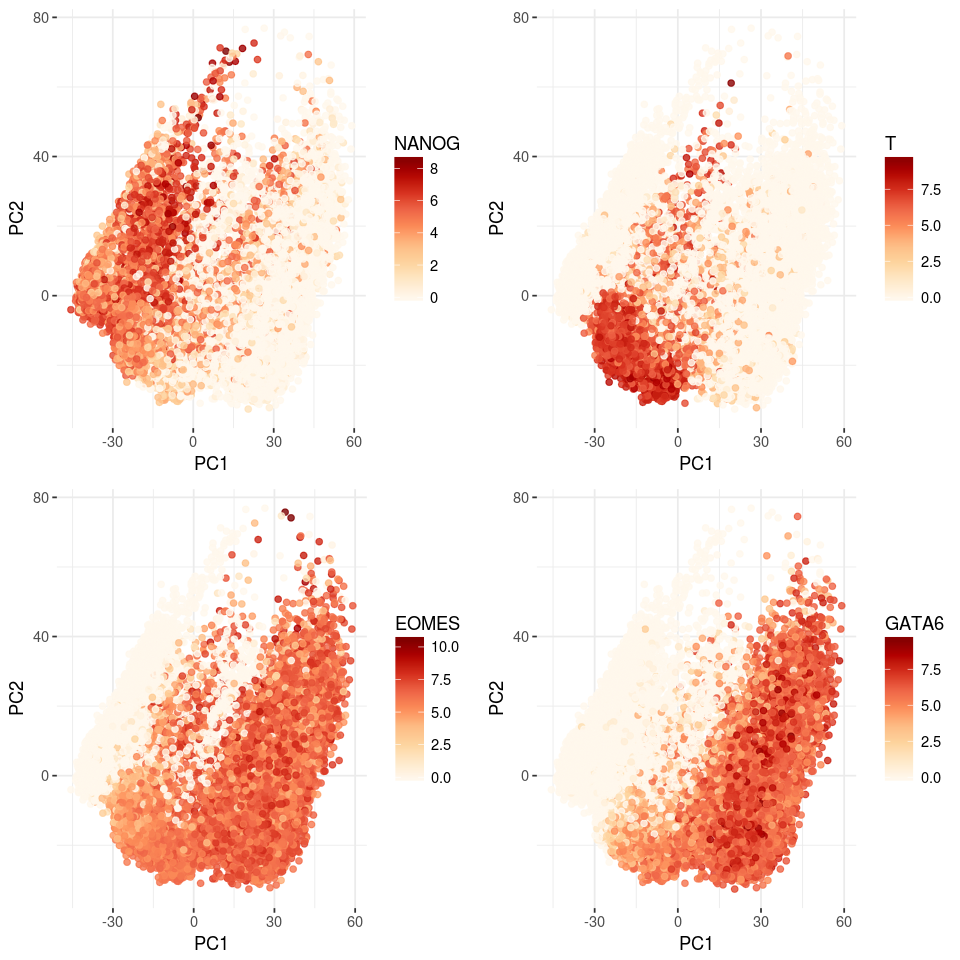

In [76]:
options(repr.plot.width = 8, repr.plot.height = 8)
plot_grid(p1, p2, p3, p4, ncol = 2)

In [4]:
sce

class: SingleCellExperiment 
dim: 11231 36044 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(17): exprs_collapsed_to ensembl_transcript_id ...
  is_intop2000hvg is_hvg
colnames(36044): 21843_1#10 21843_1#100 ... 24539_8#97 24539_8#98
colData names(123): adj_x adj_y ... princ_curve princ_curve_scaled01
reducedDimNames(1): PCA
spikeNames(1): ERCC

In [12]:
library(scran)

Loading required package: BiocParallel


In [13]:
sce = normalize(sce)
design = model.matrix(~ experiment, data = colData(sce))
alt.fit = trendVar(sce, design = design, use.spikes = FALSE)
alt.decomp = decomposeVar(sce, alt.fit)

Warning message in .local(object, ...):
“spike-in transcripts in 'ERCC' should have their own size factors”

In [14]:
top.100hvgs = rownames(alt.decomp[order(alt.decomp$bio, decreasing = TRUE),])[1:100]
top.200hvgs = rownames(alt.decomp[order(alt.decomp$bio, decreasing = TRUE),])[1:200]
top.500hvgs = rownames(alt.decomp[order(alt.decomp$bio, decreasing = TRUE),])[1:500]
top.1000hvgs = rownames(alt.decomp[order(alt.decomp$bio, decreasing = TRUE),])[1:1000]
top.2000hvgs = rownames(alt.decomp[order(alt.decomp$bio, decreasing = TRUE),])[1:2000]

In [15]:
rowData(sce)$is_intop100hvg <- (rownames(sce) %in% top.100hvgs)
rowData(sce)$is_intop200hvg <- (rownames(sce) %in% top.200hvgs)
rowData(sce)$is_intop500hvg <- (rownames(sce) %in% top.500hvgs)
rowData(sce)$is_intop1000hvg <- (rownames(sce) %in% top.1000hvgs)
rowData(sce)$is_intop2000hvg <- (rownames(sce) %in% top.2000hvgs)

In [16]:
hvgs <- rownames(alt.decomp[alt.decomp$FDR < 0.01,])
rowData(sce)$is_hvg <- (rownames(sce) %in% hvgs)

In [17]:
length(hvgs)

[1] 4546

In [56]:
saveRDS(sce,"/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_filt_allexpts.rds")

In [49]:
mean(table(sce$donor_short_id))
median(table(sce$donor_short_id))
table(sce$donor_short_id)[order(table(sce$donor_short_id))]

[1] 286.0635

[1] 210.5


hiaf_2 lexy_1 tavh_2 suop_5 sebz_1 zihe_1 oikd_2 bezi_1 fasu_2 sohd_3 koqx_1 
     4      7     12     17     26     26     29     31     55     57     58 
eoxi_6 quls_2 veku_2 zoio_2 babz_3 wopl_1 walu_1 bima_1 hegp_3 oilg_3 eiwy_1 
    60     62     65     67     69     69     70     75     76     77     78 
wibj_2 heth_1 oojs_1 iisa_1 uenn_3 vazt_1 laey_4 qoog_4 jogf_2 garx_2 toss_3 
    81     87     88     92     95     96     97     97    102    103    105 
yemz_1 fiaj_3 miaj_6 lepk_1 kefb_1 qihv_1 oebj_1 oicx_6 wegi_1 keui_1 qayj_3 
   110    112    113    115    117    119    122    124    133    134    134 
ueah_1 kucg_2 sita_1 ciwj_2 rayr_1 toco_5 iisa_3 cuhk_2 fejf_2 naju_1 cicb_2 
   134    140    140    141    142    145    153    154    155    163    164 
iezw_2 oaqd_3 iudw_4 vils_1 nosn_6 dixh_2 mita_2 iiyk_4 uilk_3 yoch_6 vuna_3 
   164    170    187    192    197    203    204    209    212    219    224 
tolg_6 lise_3 kolf_2 tout_1 kajh_3 hajc_1 pulk_1 fafq_1 aoxv_3 

In [57]:
pluri_markers <- c("ENSG00000111704_NANOG", "ENSG00000204531_POU5F1", 
                   "ENSG00000164362_TERT", "ENSG00000181449_SOX2",
                   "ENSG00000121570_DPPA4")
mesendo_markers <- c("ENSG00000164458_T", "ENSG00000163508_EOMES",
                     "ENSG00000185155_MIXL1")
defendo_markers <- c("ENSG00000121966_CXCR4", "ENSG00000136574_GATA4",
                     "ENSG00000141448_GATA6", "ENSG00000125798_FOXA2",
                     "ENSG00000164736_SOX17", "ENSG00000133937_GSC",
                     "ENSG00000147869_CER1", "ENSG00000132130_LHX1")
later_markers <- c("ENSG00000152804_HHEX", "ENSG00000170608_FOXA3")
diff_genes <- c(pluri_markers, mesendo_markers, defendo_markers, later_markers)

In [66]:
# dim(sce[rowData(sce)$is_intop200hvg | rownames(sce) %in% diff_genes,])
# pca.100hvgs.diff = prcomp(t(logcounts(sce[rowData(sce)$is_intop100hvg | rownames(sce) %in% diff_genes,])))
# pca.200hvgs.diff = prcomp(t(logcounts(sce[rowData(sce)$is_intop200hvg | rownames(sce) %in% diff_genes,])))
# pca.500hvgs.diff = prcomp(t(logcounts(sce[rowData(sce)$is_intop500hvg | rownames(sce) %in% diff_genes,])))
pca.1000hvgs.diff = prcomp(t(logcounts(sce[rowData(sce)$is_intop1000hvg | rownames(sce) %in% diff_genes,])))

In [18]:
# pca.hvgs = prcomp(t(logcounts(sce[rowData(sce)$is_hvg,])))
# pca.100hvgs = prcomp(t(logcounts(sce[rowData(sce)$is_intop100hvg,])))
# pca.200hvgs = prcomp(t(logcounts(sce[rowData(sce)$is_intop200hvg,])))
pca.500hvgs = prcomp(t(logcounts(sce[rowData(sce)$is_intop500hvg,])))
# pca.1000hvgs = prcomp(t(logcounts(sce[rowData(sce)$is_intop1000hvg,])))
# pca.2000hvgs= prcomp(t(logcounts(sce[rowData(sce)$is_intop2000hvg,])))

In [13]:
set.seed(147)
tsne.500hvgs <- Rtsne(t(logcounts(sce[rowData(sce)$is_intop500hvg,])), pca = TRUE)
head(tsne.500hvgs$Y)

-0.3103823,-21.21778
-11.8846192,-32.51201
-11.3352758,-32.72800
-0.3967707,-20.95813
-1.5110039,-22.85230
-1.2616788,-24.36245


In [19]:
# sce$PC1_top100hvgs = pca.100hvgs$x[,1]
# sce$PC1_top200hvgs = pca.200hvgs$x[,1]
sce$PC1_top500hvgs = pca.500hvgs$x[,1]
# sce$PC1_top1000hvgs = pca.1000hvgs$x[,1]
# sce$PC1_top2000hvgs = pca.2000hvgs$x[,1]

In [20]:
head(sce$PC1_top500hvgs)

21843_1#10 21843_1#100 21843_1#101 21843_1#102 21843_1#103 21843_1#105 
-11.7695261   5.1315308  -0.6430211 -14.5080208  -5.8029849  -2.3442226

In [22]:
# plot_pca_stage <- function(pca.set, sce){
#     df = as.data.frame(pca.set$x[,1:2])
#     df = cbind(df, data.frame(stage = sce$stage, day = sce$day))
#     perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
#     p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(stage)))
#     p = p + geom_point(alpha = 0.5, size = 0.8) + 
#     p = p + scale_colour_manual(values = c("coral","cornflowerblue","forestgreen","gray")) 
#     p = p + theme_bw() + theme(legend.position = "none", panel.border = element_blank())  
#     p
# }

In [3]:
sce = readRDS("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_filt_allexpts.rds")

In [62]:
plot_pca_day <- function(pca.set, sce){
    df = as.data.frame(pca.set$x[,1:2])
    df = cbind(df, data.frame(day = sce$day))
    perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
    p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(day)))
    p = p + geom_point(alpha = 0.2, size = 0.8) 
    p = p + scale_color_canva(palette = "Pool party") 
    p = p + theme_bw() + theme(legend.position = "none", panel.border = element_blank())
    p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
    p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
    p
}

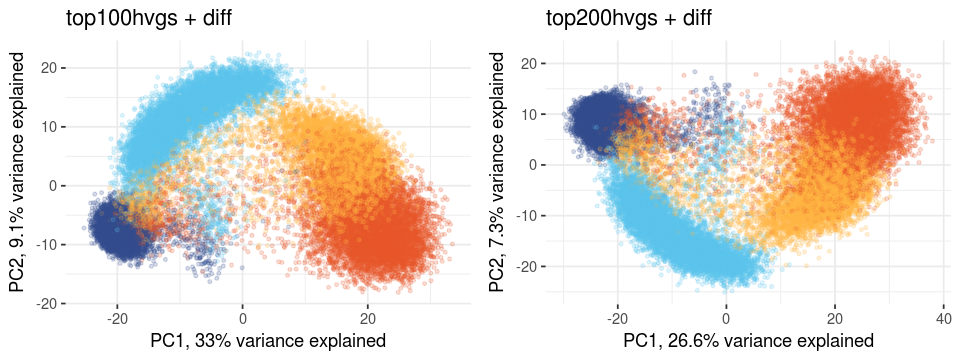

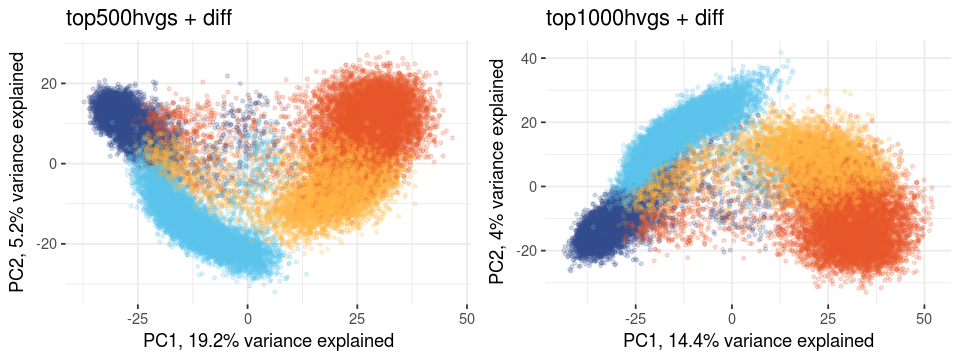

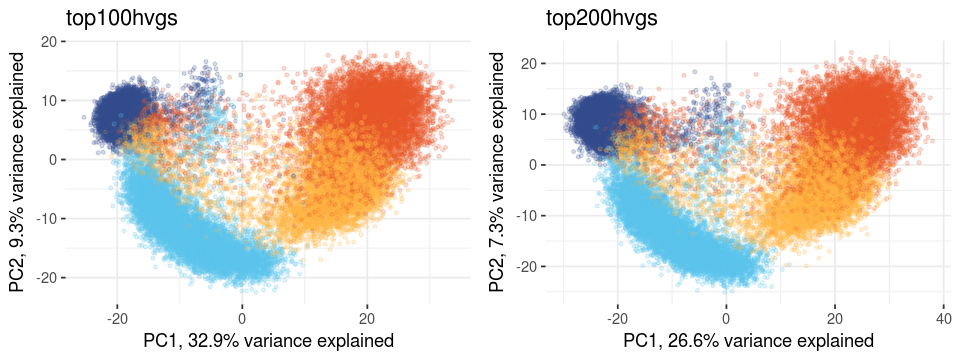

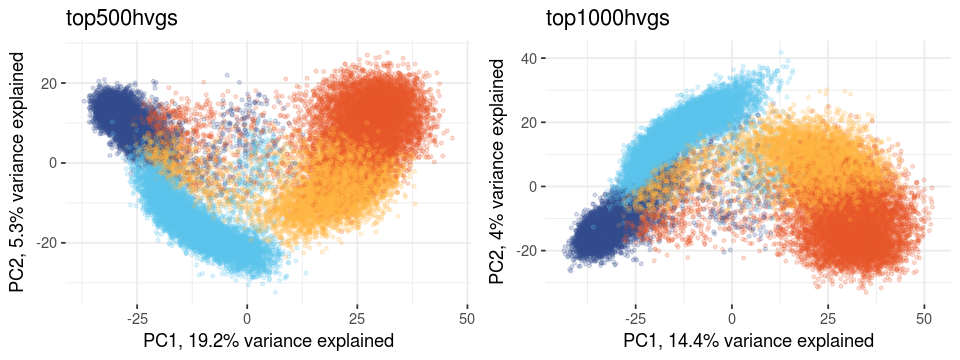

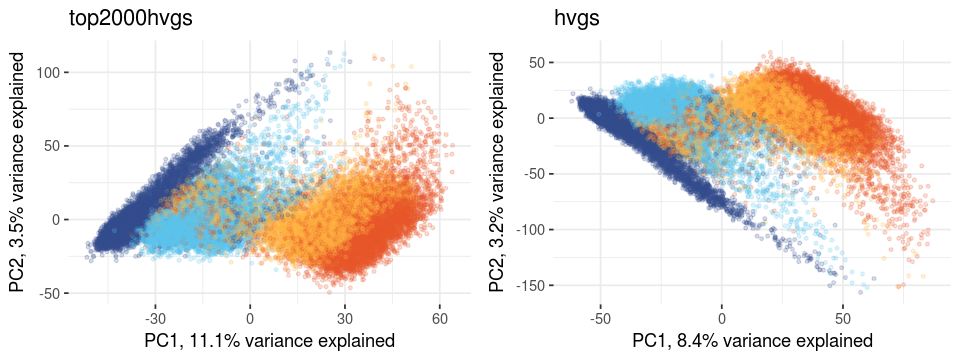

In [67]:
p1 = plot_pca_day(pca.100hvgs.diff, sce[rowData(sce)$is_intop100hvg | rownames(sce) %in% diff_genes,]) + ggtitle("top100hvgs + diff")
p2 = plot_pca_day(pca.200hvgs, sce[rowData(sce)$is_intop200hvg | rownames(sce) %in% diff_genes,]) + ggtitle("top200hvgs + diff")
options(repr.plot.width = 8, repr.plot.height = 3)
plot_grid(p1, p2, ncol = 2)
p1 = plot_pca_day(pca.500hvgs.diff, sce[rowData(sce)$is_intop500hvg | rownames(sce) %in% diff_genes,]) + ggtitle("top500hvgs + diff")
p2 = plot_pca_day(pca.1000hvgs, sce[rowData(sce)$is_intop1000hvg | rownames(sce) %in% diff_genes,]) + ggtitle("top1000hvgs + diff")
options(repr.plot.width = 8, repr.plot.height = 3)
plot_grid(p1, p2, ncol = 2)
p1 = plot_pca_day(pca.100hvgs, sce[rowData(sce)$is_intop100hvg,]) + ggtitle("top100hvgs")
p2 = plot_pca_day(pca.200hvgs, sce[rowData(sce)$is_intop200hvg,]) + ggtitle("top200hvgs")
options(repr.plot.width = 8, repr.plot.height = 3)
plot_grid(p1, p2, ncol = 2)
p1 = plot_pca_day(pca.500hvgs, sce[rowData(sce)$is_intop500hvg,]) + ggtitle("top500hvgs")
p2 = plot_pca_day(pca.1000hvgs, sce[rowData(sce)$is_intop1000hvg,]) + ggtitle("top1000hvgs")
plot_grid(p1, p2, ncol = 2)
p1 = plot_pca_day(pca.2000hvgs, sce[rowData(sce)$is_intop2000hvg,]) + ggtitle("top2000hvgs")
p2 = plot_pca_day(pca.hvgs, sce[rowData(sce)$is_hvg,]) + ggtitle("hvgs")
plot_grid(p1, p2, ncol = 2)

In [14]:
sce

class: SingleCellExperiment 
dim: 11231 36044 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(17): exprs_collapsed_to ensembl_transcript_id ...
  is_intop2000hvg is_hvg
colnames(36044): 21843_1#10 21843_1#100 ... 24539_8#97 24539_8#98
colData names(123): adj_x adj_y ... princ_curve princ_curve_scaled01
reducedDimNames(1): PCA
spikeNames(1): ERCC

In [12]:
plot_pca_day_loess <- function(pca.set, sce){
    df = data.frame(PC1 = pca.set$x[,1], PC2 = pca.set$x[,2], day = sce$day)
    PC2.loess <- loess(df$PC2 ~ df$PC1, span = 0.75, data.frame(x = df$PC1, y = df$PC2))
    PC2.predict <- predict(PC2.loess, data.frame(x = df$PC1))
    df$PC2predict = PC2.predict
    perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
    p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(day)))
    p = p + geom_point(alpha = 0.1, size = 0.8) 
    p = p + scale_color_canva(palette = "Pool party") 
    p = p + theme_bw() + theme(legend.position = "none", panel.border = element_blank())
    p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
    p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
    p = p + geom_line(aes(x = PC1, y = PC2predict), col = "darkblue")
    p
}

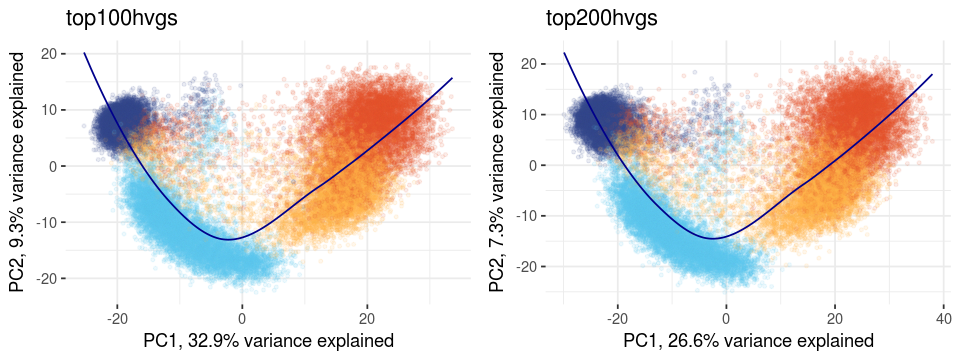

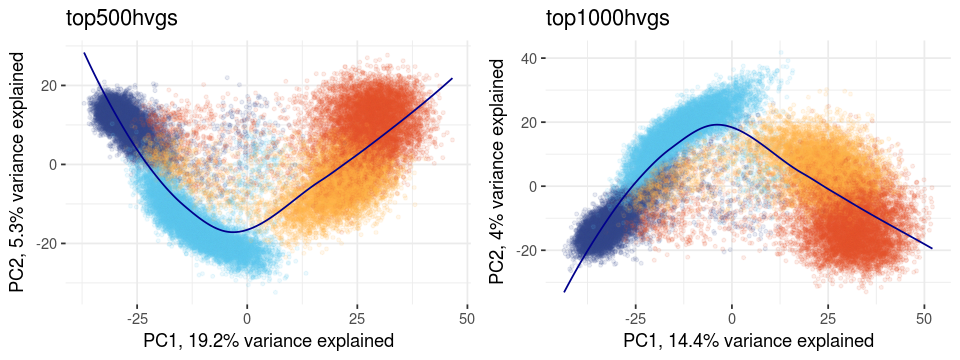

In [14]:
p1 = plot_pca_day_loess(pca.100hvgs, sce[rowData(sce)$is_intop100hvg,]) + ggtitle("top100hvgs")
p2 = plot_pca_day_loess(pca.200hvgs, sce[rowData(sce)$is_intop200hvg,]) + ggtitle("top200hvgs")
options(repr.plot.width = 8, repr.plot.height = 3)
plot_grid(p1, p2, ncol = 2)
p1 = plot_pca_day_loess(pca.500hvgs, sce[rowData(sce)$is_intop500hvg,]) + ggtitle("top500hvgs")
p2 = plot_pca_day_loess(pca.1000hvgs, sce[rowData(sce)$is_intop1000hvg,]) + ggtitle("top1000hvgs")
options(repr.plot.width = 8, repr.plot.height = 3)
plot_grid(p1, p2, ncol = 2)

In [15]:
install.packages("princurve")

Updating HTML index of packages in '.Library'
Making 'packages.html' ... done


In [16]:
library(princurve)

princ.curve = principal.curve(x = pca.500hvgs$x[,1:2])

In [17]:
str(princ.curve)

List of 7
 $ s              : num [1:36044, 1:2] -12.75 2.32 -1.08 -13.8 -5.52 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:36044] "21843_1#10" "21843_1#100" "21843_1#101" "21843_1#102" ...
  .. ..$ : chr [1:2] "PC1" "PC2"
 $ tag            : int [1:36044] 32053 26282 18366 32024 34988 27017 30764 26093 13331 26945 ...
 $ lambda         : num [1:36044] 40 56.4 53 38.4 48.5 ...
 $ dist           : num 851273
 $ converged      : logi TRUE
 $ nbrOfIterations: int 6
 $ call           : language principal.curve(x = pca.500hvgs$x[, 1:2])
 - attr(*, "class")= chr "principal.curve"


In [15]:
pca.set = pca.500hvgs
df = data.frame(PC1 = pca.set$x[,1], PC2 = pca.set$x[,2], day = sce$day)
df = as.data.frame(cbind(df, colData(sce)))
# colnames(df)

In [ ]:
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour =  size_factor))
p = p + geom_point(alpha = 0.2, size = 0.8) 
p = p + scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) 
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

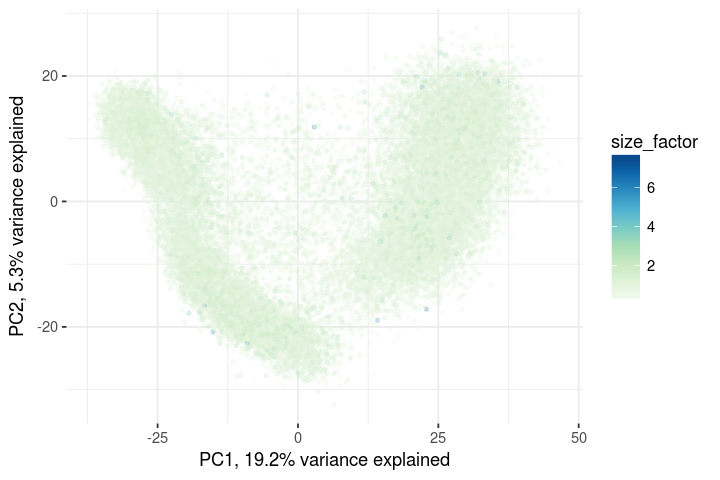

In [60]:
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour =  size_factor))
p = p + geom_point(alpha = 0.2, size = 0.8) 
p = p + scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) 
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

In [59]:
# head(sce$cell_cycle_seurat)

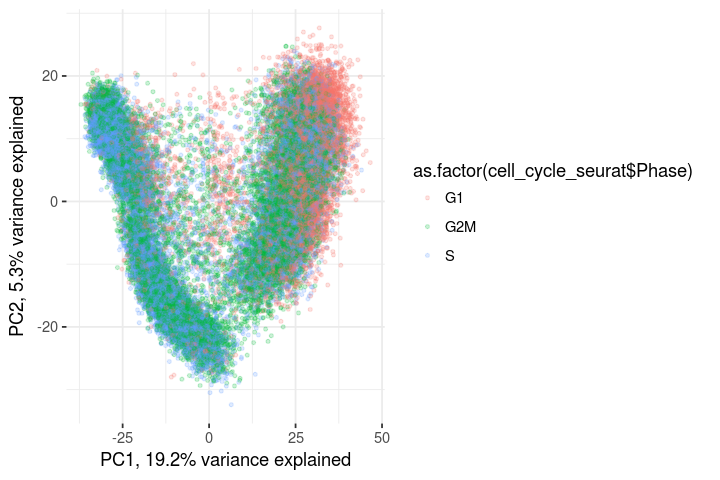

In [58]:
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(cell_cycle_seurat$Phase)))
p = p + geom_point(alpha = 0.2, size = 0.8) 
# p = p + scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) 
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

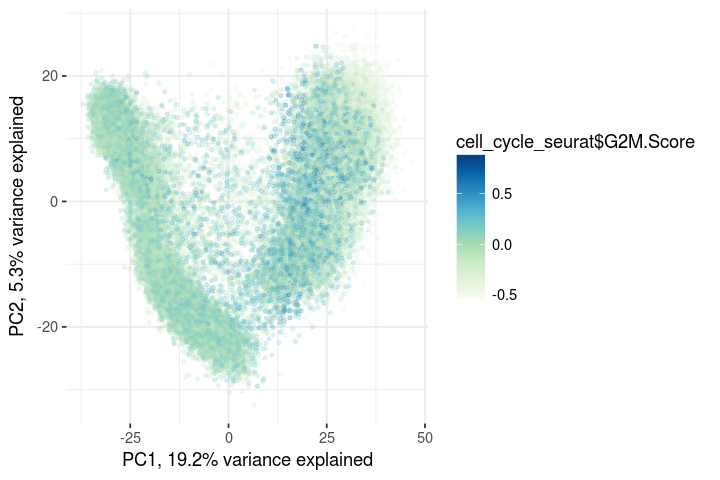

In [57]:
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = cell_cycle_seurat$G2M.Score))
p = p + geom_point(alpha = 0.2, size = 0.8) 
p = p + scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) 
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

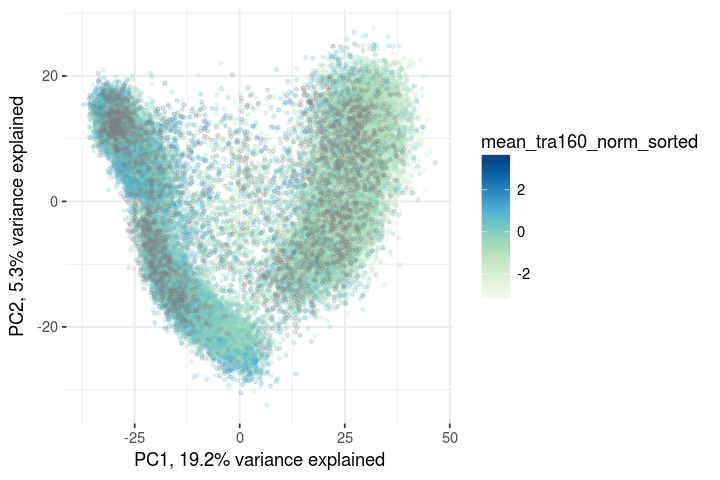

In [53]:
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = mean_tra160_norm_sorted))
p = p + geom_point(alpha = 0.2, size = 0.8) 
p = p + scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) 
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

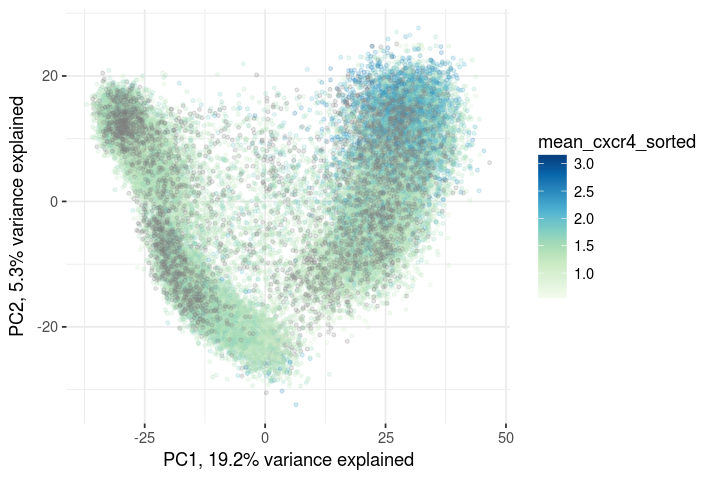

In [52]:
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = mean_cxcr4_sorted))
p = p + geom_point(alpha = 0.2, size = 0.8) 
p = p + scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) 
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

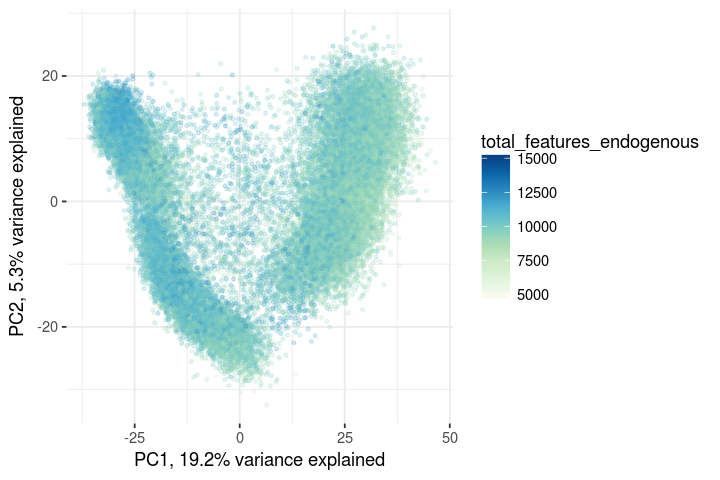

In [50]:
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = total_features_endogenous))
p = p + geom_point(alpha = 0.2, size = 0.8) 
p = p + scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) 
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

In [21]:
pca.set = pca.500hvgs
df = data.frame(PC1 = pca.set$x[,1], PC2 = pca.set$x[,2], day = sce$day)
df = as.data.frame(cbind(df, colData(sce)))
# colnames(df)

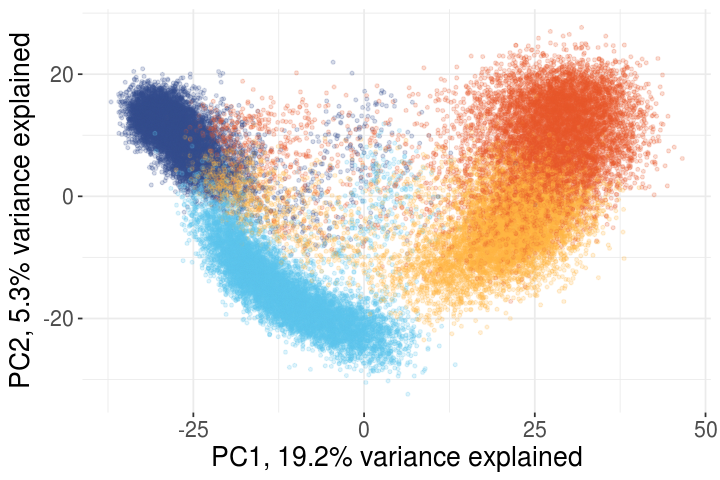

In [15]:
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(day)))
p = p + geom_point(alpha = 0.2, size = 0.8) #+ ggtitle("PCA, top 500 hvgs")
p = p + scale_color_canva(palette = "Pool party") 
p = p + theme_bw() + theme(legend.position = "none", panel.border = element_blank(), text = element_text(size = 16))
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

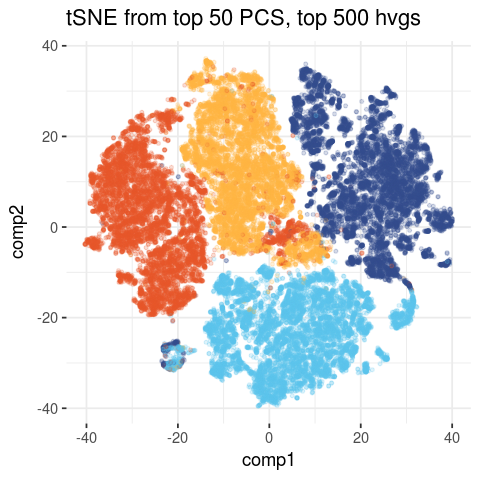

In [34]:
options(repr.plot.width = 4, repr.plot.height = 4)
plot_tsne_day(tsne.500hvgs, sce[rowData(sce)$is_intop500hvg,]) + ggtitle("tSNE from top 50 PCS, top 500 hvgs")

In [4]:
monogenic_diabetes_lines <- c("dixh_2", "koqx_1", "oebj_1", "eoxi_6", "pulk_1",
                              "fasu_2", "walu_1", "biiw_6", "cekz_1", "tout_1",
                              "fuai_1", "oojs_1", "guyj_2", "eevy_7", "zoio_2", "tach_2")

In [6]:
sce_diabetes = sce[,sce$donor_short_id %in% monogenic_diabetes_lines]

In [7]:
unique(sce_diabetes$experiment)
unique(sce_diabetes$donor_short_id)

[1] "expt_18" "expt_20" "expt_21" "expt_22" "expt_23" "expt_24" "expt_40"

[1] "zoio_2" "fasu_2" "tout_1" "dixh_2" "koqx_1" "oebj_1" "oojs_1" "pulk_1"
 [9] "eoxi_6" "guyj_2" "walu_1"

In [9]:
table(sce_diabetes$donor_short_id,sce_diabetes$experiment)

        
         expt_18 expt_20 expt_21 expt_22 expt_23 expt_24 expt_40
  dixh_2       0       0     203       0       0       0       0
  eoxi_6       0       0       0      60       0       0       0
  fasu_2       0      55       0       0       0       0       0
  guyj_2       0       0       0       0     343     128       0
  koqx_1       0       0      58       0       0       0       0
  oebj_1       0       0      37      85       0       0       0
  oojs_1       0       0       0      88       0       0       0
  pulk_1       0       0       0     118     148       0       0
  tout_1       0      22       0       0       0       0     225
  walu_1       0       0       0       0       0      70       0
  zoio_2      67       0       0       0       0       0       0

In [23]:
experiments_with_monogenic_diabetes_lines = unique(sce[,sce$donor_short_id %in% monogenic_diabetes_lines]$experiment)
experiments_with_monogenic_diabetes_lines

[1] "expt_18" "expt_20" "expt_21" "expt_22" "expt_23" "expt_24" "expt_40"

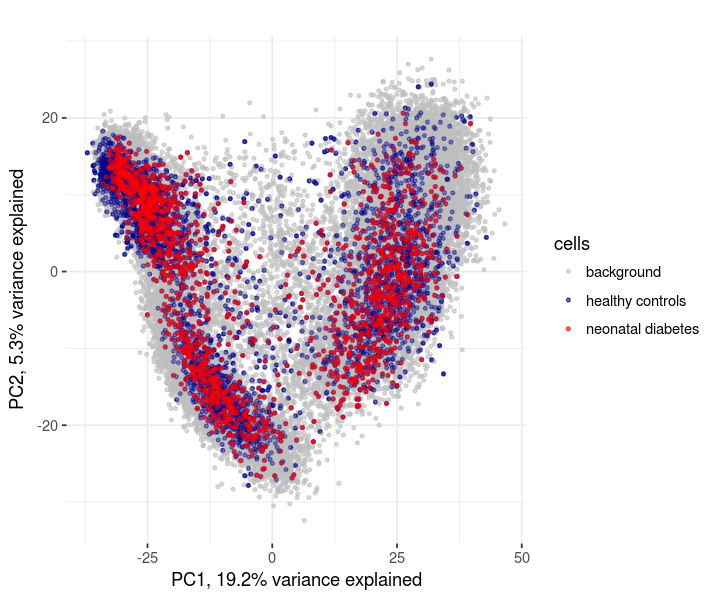

In [37]:
# neonatal diabetes
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
df$cells = "background"
df[df$experiment %in% experiments_with_monogenic_diabetes_lines,"cells"] = "healthy controls"
df[df$donor_short_id %in% monogenic_diabetes_lines,"cells"] = "neonatal diabetes"
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = cells))
p = p + scale_colour_manual(values = c("gray","darkblue","red")) 
p = p + geom_point(alpha = 0.6, size = 0.8) + ggtitle("")
p = p + geom_point(aes(x = as.numeric(PC1), y = as.numeric(PC2)), size = 0.8, col = "darkblue",
                  data = df[df$experiment %in% experiments_with_monogenic_diabetes_lines,], alpha = 0.4)
p = p + geom_point(aes(x = as.numeric(PC1), y = as.numeric(PC2)), size = 0.8,
                  data = df[df$donor_short_id %in% monogenic_diabetes_lines,], alpha = 0.5, col = "red")
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 5)
p

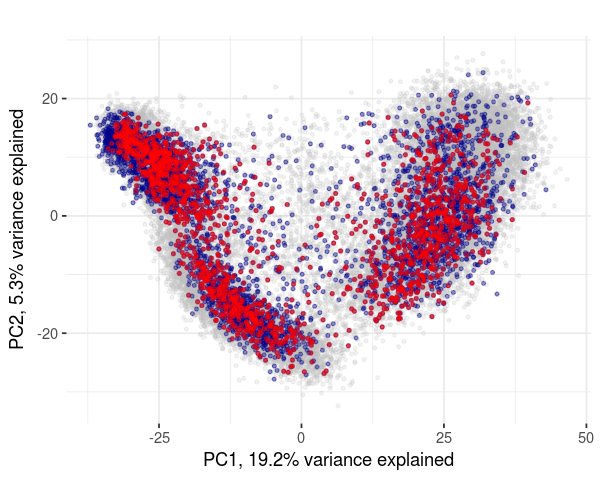

In [36]:
# neonatal diabetes
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)

p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2)))

p = p + geom_point(alpha = 0.2, size = 0.8, col = "grey") + ggtitle("")
p = p + geom_point(aes(x = as.numeric(PC1), y = as.numeric(PC2)), size = 0.8, col = "darkblue",
                  data = df[df$experiment %in% experiments_with_monogenic_diabetes_lines,], alpha = 0.4)
p = p + geom_point(aes(x = as.numeric(PC1), y = as.numeric(PC2)), size = 0.8,
                  data = df[df$donor_short_id %in% monogenic_diabetes_lines,], alpha = 0.5, col = "red")
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 5, repr.plot.height = 4)
p

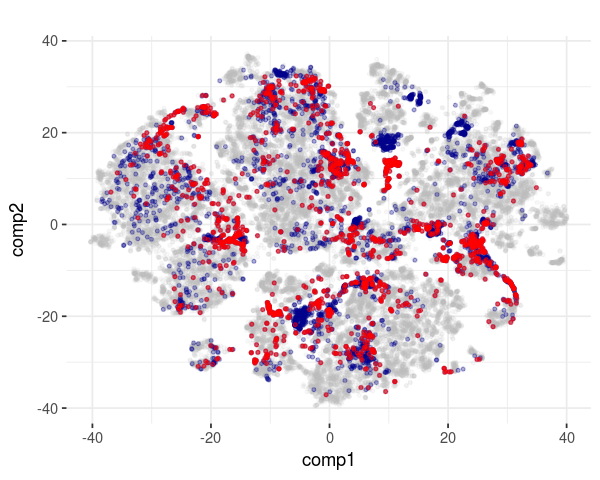

In [30]:
df = data.frame(comp1 = tsne.500hvgs$Y[,1], comp2 = tsne.500hvgs$Y[,2], day = sce$day)
df = as.data.frame(cbind(df, colData(sce)))
p = ggplot(df, aes(x = comp1, y = comp2))
p = p + geom_point(alpha = 0.1, size = 0.8, col = "grey") + ggtitle("")
# p = p + scale_color_canva(palette = "Pool party") 
p = p + geom_point(aes(x = comp1, y = comp2), size = 0.8, col = "darkblue",
                  data = df[df$experiment %in% experiments_with_monogenic_diabetes_lines,], alpha = 0.3)
p = p + geom_point(aes(x = comp1, y = comp2), size = 0.8,
                  data = df[df$donor_short_id %in% monogenic_diabetes_lines,], alpha = 0.5, col = "red")
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab("comp1") + ylab("comp2")
options(repr.plot.width = 5, repr.plot.height = 4)
p

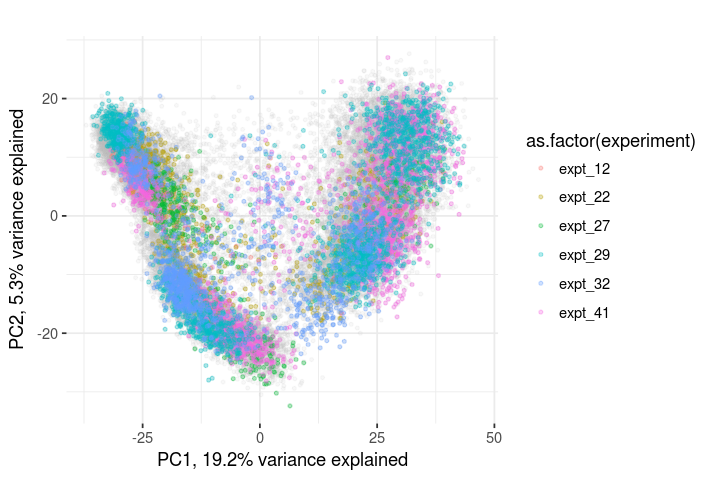

In [29]:
set.seed(140792)
expts_sel = unique(df$experiment)[sample(length(unique(df$experiment)),6)]
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2)))
p = p + geom_point(alpha = 0.1, size = 0.8, col = "grey") + ggtitle("")
# p = p + scale_color_canva(palette = "Pool party") 
p = p + geom_point(aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(experiment)), size = 0.8,
                  data = df[df$experiment %in% expts_sel,], alpha = 0.3)
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

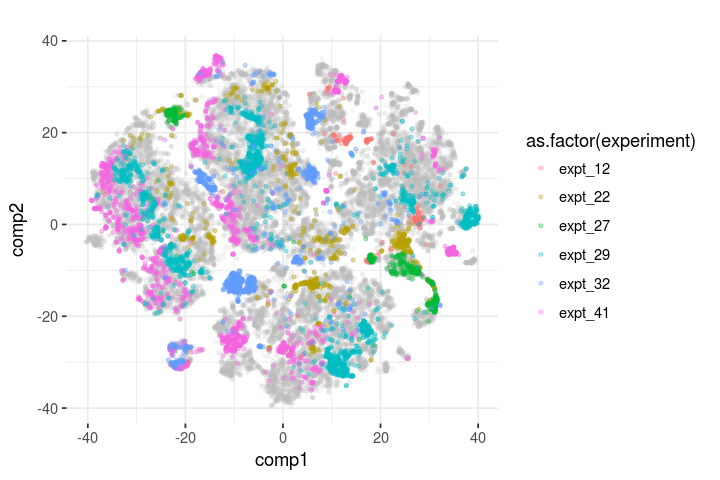

In [32]:
df = data.frame(comp1 = tsne.500hvgs$Y[,1], comp2 = tsne.500hvgs$Y[,2], day = sce$day)
df = as.data.frame(cbind(df, colData(sce)))
p = ggplot(df, aes(x = comp1, y = comp2))
p = p + geom_point(alpha = 0.1, size = 0.8, col = "grey") + ggtitle("")
# p = p + scale_color_canva(palette = "Pool party") 
p = p + geom_point(aes(x = comp1, y = comp2, colour = as.factor(experiment)), size = 0.8,
                  data = df[df$experiment %in% expts_sel,], alpha = 0.3)
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab("comp1") + ylab("comp2")
options(repr.plot.width = 6, repr.plot.height = 4)
p

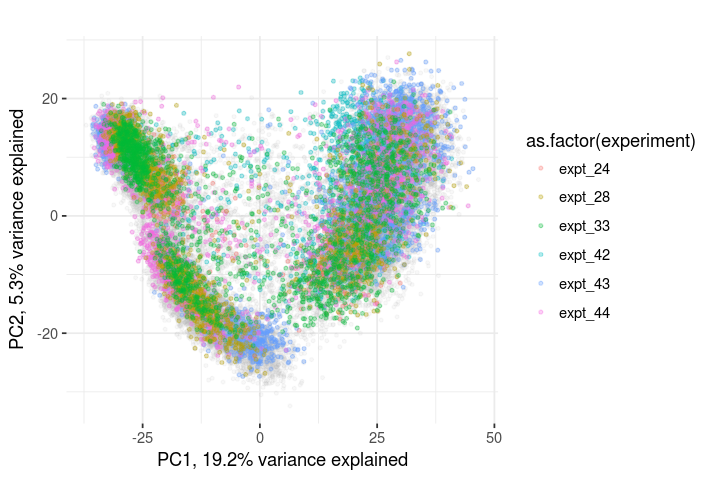

In [43]:
pca.set = pca.500hvgs
df = data.frame(PC1 = pca.set$x[,1], PC2 = pca.set$x[,2], day = sce$day)
df = as.data.frame(cbind(df, colData(sce)))
set.seed(3892)
expts_sel = unique(df$experiment)[sample(length(unique(df$experiment)),6)]
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2)))
p = p + geom_point(alpha = 0.1, size = 0.8, col = "grey") + ggtitle("")
# p = p + scale_color_canva(palette = "Pool party") 
p = p + geom_point(aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(experiment)), size = 0.8,
                  data = df[df$experiment %in% expts_sel,], alpha = 0.3)
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

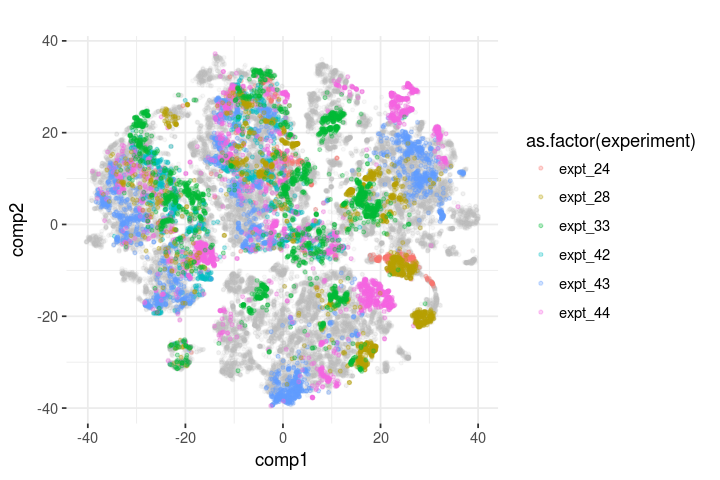

In [44]:
df = data.frame(comp1 = tsne.500hvgs$Y[,1], comp2 = tsne.500hvgs$Y[,2], day = sce$day)
df = as.data.frame(cbind(df, colData(sce)))
p = ggplot(df, aes(x = comp1, y = comp2))
p = p + geom_point(alpha = 0.1, size = 0.8, col = "grey") + ggtitle("")
# p = p + scale_color_canva(palette = "Pool party") 
p = p + geom_point(aes(x = comp1, y = comp2, colour = as.factor(experiment)), size = 0.8,
                  data = df[df$experiment %in% expts_sel,], alpha = 0.3)
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab("comp1") + ylab("comp2")
options(repr.plot.width = 6, repr.plot.height = 4)
p

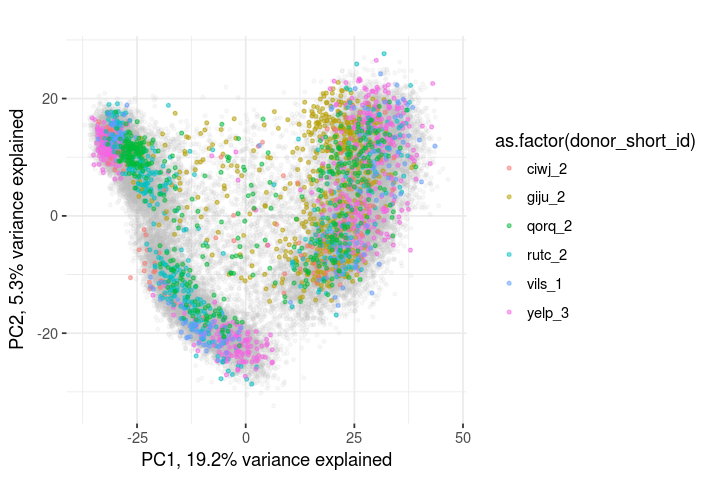

In [49]:
pca.set = pca.500hvgs
df = data.frame(PC1 = pca.set$x[,1], PC2 = pca.set$x[,2], day = sce$day)
df = as.data.frame(cbind(df, colData(sce)))
set.seed(3892)
donor_sel = unique(df$donor_short_id)[sample(length(unique(df$donor_short_id)),6)]
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2)))
p = p + geom_point(alpha = 0.1, size = 0.8, col = "grey") + ggtitle("")
# p = p + scale_color_canva(palette = "Pool party") 
p = p + geom_point(aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(donor_short_id)), size = 0.8,
                  data = df[df$donor_short_id %in% donor_sel,], alpha = 0.5)
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

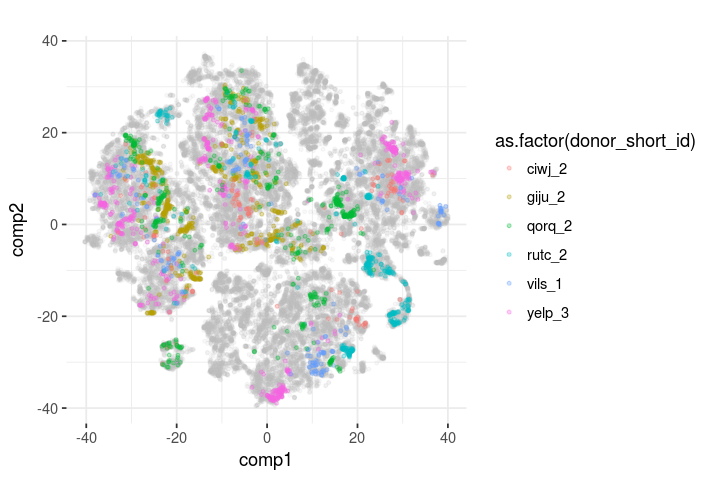

In [50]:
df = data.frame(comp1 = tsne.500hvgs$Y[,1], comp2 = tsne.500hvgs$Y[,2], day = sce$day)
df = as.data.frame(cbind(df, colData(sce)))
p = ggplot(df, aes(x = comp1, y = comp2))
p = p + geom_point(alpha = 0.1, size = 0.8, col = "grey") + ggtitle("")
# p = p + scale_color_canva(palette = "Pool party") 
p = p + geom_point(aes(x = comp1, y = comp2, colour = as.factor(donor_short_id)), size = 0.8,
                  data = df[df$donor_short_id %in% donor_sel,], alpha = 0.3)
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab("comp1") + ylab("comp2")
options(repr.plot.width = 6, repr.plot.height = 4)
p

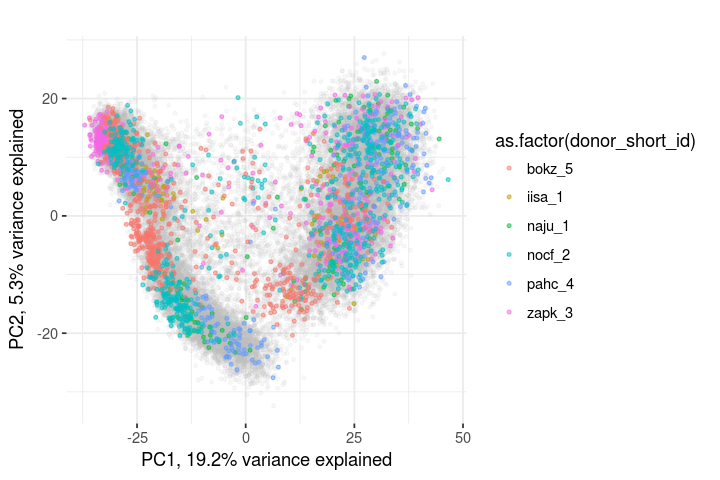

In [52]:
pca.set = pca.500hvgs
df = data.frame(PC1 = pca.set$x[,1], PC2 = pca.set$x[,2], day = sce$day)
df = as.data.frame(cbind(df, colData(sce)))
set.seed(140792)
donor_sel = unique(df$donor_short_id)[sample(length(unique(df$donor_short_id)),6)]
perc_var <- round(summary(pca.set)$importance[2,]*100, 1)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2)))
p = p + geom_point(alpha = 0.1, size = 0.8, col = "grey") + ggtitle("")
# p = p + scale_color_canva(palette = "Pool party") 
p = p + geom_point(aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(donor_short_id)), size = 0.8,
                  data = df[df$donor_short_id %in% donor_sel,], alpha = 0.5)
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
options(repr.plot.width = 6, repr.plot.height = 4)
p

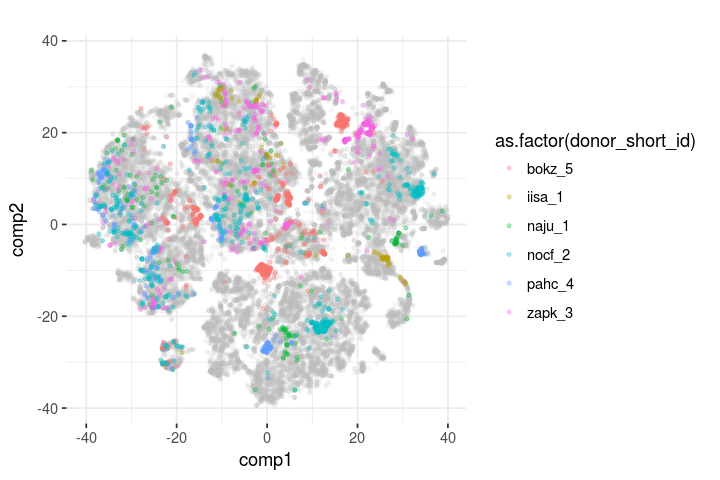

In [53]:
df = data.frame(comp1 = tsne.500hvgs$Y[,1], comp2 = tsne.500hvgs$Y[,2], day = sce$day)
df = as.data.frame(cbind(df, colData(sce)))
p = ggplot(df, aes(x = comp1, y = comp2))
p = p + geom_point(alpha = 0.1, size = 0.8, col = "grey") + ggtitle("")
# p = p + scale_color_canva(palette = "Pool party") 
p = p + geom_point(aes(x = comp1, y = comp2, colour = as.factor(donor_short_id)), size = 0.8,
                  data = df[df$donor_short_id %in% donor_sel,], alpha = 0.3)
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + xlab("comp1") + ylab("comp2")
options(repr.plot.width = 6, repr.plot.height = 4)
p

In [19]:
df = as.data.frame(princ.curve$s)
df$ordering = princ.curve$tag
df$lambda = princ.curve$lambda

In [20]:
range01 <- function(x){(x-min(x))/(max(x)-min(x))}
df$pseudo <- range01(df$lambda)
head(df)

,PC1,PC2,ordering,lambda,pseudo
21843_1#10,-12.747696,-13.50577,32053,39.97259,0.3525701
21843_1#100,2.324389,-17.50688,26282,56.43339,0.4977592
21843_1#101,-1.077655,-18.14586,18366,52.96614,0.4671771
21843_1#102,-13.799545,-12.36418,32024,38.41998,0.3388757
21843_1#103,-5.522959,-17.80451,34988,48.48806,0.4276791
21843_1#105,-2.332839,-18.19498,27017,51.70961,0.4560942


In [89]:
cor(df$PC1, df$lambda, method = "spearman")

[1] 1

In [59]:
diff_genes_reduced = c("ENSG00000111704_NANOG", "ENSG00000164458_T", "ENSG00000163508_EOMES", "ENSG00000141448_GATA6")

In [62]:
df = data.frame(cell = sce$cell_name, day = sce$day, expt = sce$experiment, donor = sce$donor, 
                pseudo = range01(princ.curve$lambda)) 

In [63]:
plist = list()
for (i in 1:length(diff_genes_reduced)){
    gene = diff_genes_reduced[i]
    df$gene = logcounts(sce)[gene,]
    plist[[i]] = ggplot(df, aes(x = as.numeric(pseudo), y = as.numeric(gene), colour = as.factor(day))) + 
            geom_point(alpha = 0.2, pch = 20) 
}

`geom_smooth()` using method = 'gam'
`geom_smooth()` using method = 'gam'
`geom_smooth()` using method = 'gam'
`geom_smooth()` using method = 'gam'


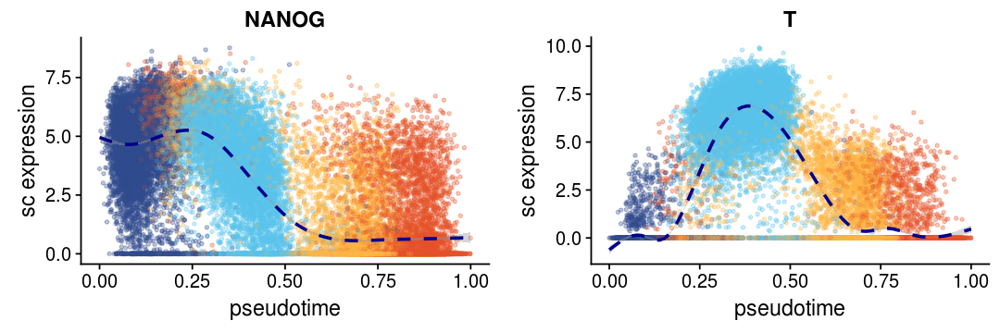

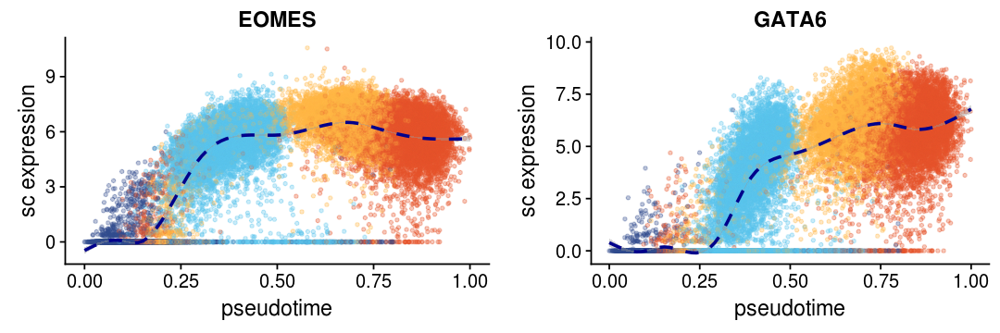

In [64]:
options(repr.plot.width = 9, repr.plot.height = 3) 
plist = plist
for (j in seq(2, length(diff_genes_reduced), by = 2)){
    p1 = plist[[j-1]]
    p1 = p1 + ggtitle(gsub(".*_","",diff_genes_reduced[j-1])) + 
         xlab("pseudotime") + ylab("sc expression") + labs(colour = "day") + 
        scale_color_canva(palette = "Pool party") + geom_point(alpha = 0.15, pch = 20) +
        stat_smooth(colour = "darkblue", linetype = 2)+  
        theme(legend.position="none", panel.border = element_blank())
    p2 = plist[[j]]
    p2 = p2 + ggtitle(gsub(".*_","",diff_genes_reduced[j])) + 
        xlab("pseudotime") + ylab("sc expression") + labs(colour = "day") + 
        scale_color_canva(palette = "Pool party") + geom_point(alpha = 0.15, pch = 20) +
        stat_smooth(colour = "darkblue", linetype = 2) + 
        theme(legend.position="none", panel.border = element_blank())
    print(plot_grid(p1, p2, ncol = 2))
}

In [21]:
sce$princ_curve <- princ.curve$lambda
sce$princ_curve_scaled01 <- range01(princ.curve$lambda)

In [78]:
sce

class: SingleCellExperiment 
dim: 11231 36044 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(17): exprs_collapsed_to ensembl_transcript_id ...
  is_intop2000hvg is_hvg
colnames(36044): 21843_1#10 21843_1#100 ... 24539_8#97 24539_8#98
colData names(123): adj_x adj_y ... princ_curve princ_curve_scaled01
reducedDimNames(1): PCA
spikeNames(1): ERCC

In [98]:
saveRDS(sce,"/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20181003/sce_merged.rds")

In [30]:
table(sce$stage_lambda)


     defendo          ips      mesendo not assigned 
       15036         9149        10499         1360 

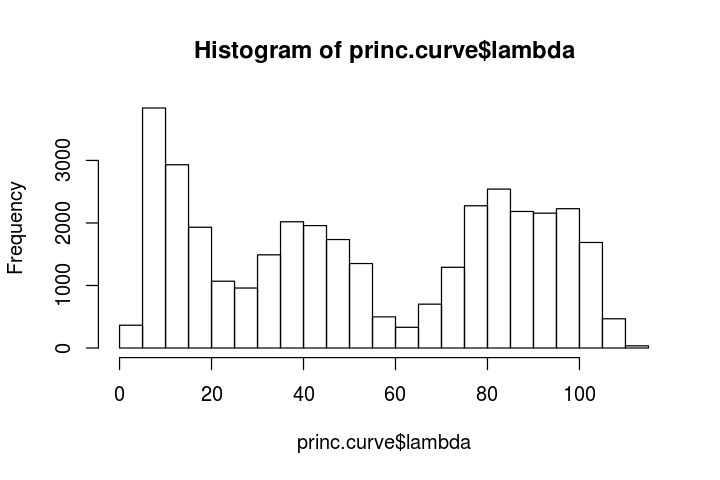

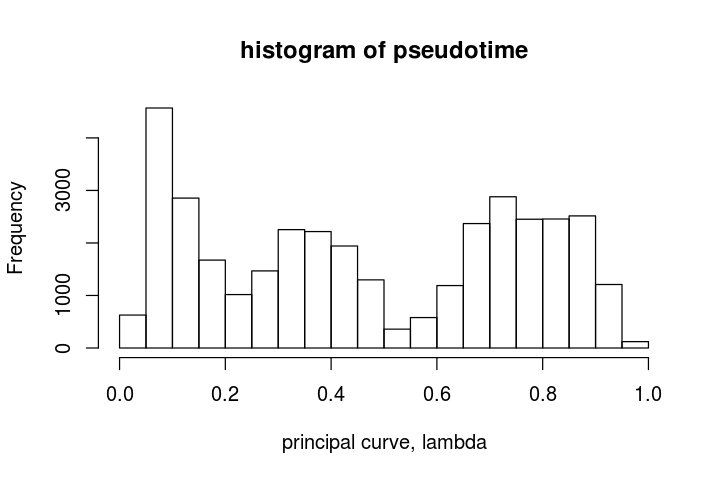

In [23]:
options(repr.plot.width = 6, repr.plot.height = 4) 
hist(princ.curve$lambda)
hist(range01(princ.curve$lambda), xlab = "principal curve, lambda", main = "histogram of pseudotime")

In [24]:
ncol(sce[,sce$princ_curve_scaled01 < 0.2])
ncol(sce[,sce$princ_curve_scaled01 < 0.2 & sce$day == "day0"])

[1] 9723

[1] 9149

In [25]:
ncol(sce[,sce$princ_curve_scaled01 > 0.2 & sce$princ_curve_scaled01 < 0.6])
ncol(sce[,sce$princ_curve_scaled01 > 0.2 & sce$princ_curve_scaled01 < 0.6 & sce$day %in% c("day1","day2")])

[1] 11132

[1] 10499

In [26]:
ncol(sce[,sce$princ_curve_scaled01 > 0.6])
ncol(sce[,sce$princ_curve_scaled01 > 0.6 & sce$day %in% c("day2","day3")])

[1] 15189

[1] 15036

In [27]:
sce$stage_lambda <- "not assigned"
sce[,sce$princ_curve_scaled01 < 0.2 & sce$day == "day0"]$stage_lambda <- "ips"
sce[,sce$princ_curve_scaled01 > 0.2 & sce$princ_curve_scaled01 < 0.6 & sce$day %in% c("day1","day2")]$stage_lambda <- "mesendo"
sce[,sce$princ_curve_scaled01 > 0.6 & sce$day %in% c("day2","day3")]$stage_lambda <- "defendo"

In [28]:
table(sce$stage_lambda)


     defendo          ips      mesendo not assigned 
       15036         9149        10499         1360 

In [29]:
saveRDS(sce,"/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20181003/sce_merged.rds")

In [95]:
make_sample_mapping <- function(pheno, sce){
    df <- data.frame(donor.expt.day = colnames(pheno))
    df$donor = gsub("*-.*","",df$donor.expt.day)
    df$expt = gsub("*-.*","",gsub(".*-e","e",df$donor.expt.day))
    df$day = gsub(".*-","",df$donor.expt.day)
    df1 <- data.frame(donor_long_id = unique(sce$donor_long_id), donor = unique(sce$donor_short_id))
    df2 <- left_join(df, df1, by = "donor")
    # genotype_samples phenotype_samples
    samples = df2[,c(5,1)]
    print(head(samples))
    colnames(samples) = c()
    samples
}

In [97]:
get_combinations_morethanNcells <- function(sceset,N){
    # day0
    mysce = sceset[,sceset$day == "day0"]
    if (ncol(mysce) == 0){l0 <- c()}
    else {
        mat = table(mysce$donor_short_id, mysce$experiment) 
        ord = which(table(mysce$donor_short_id, mysce$experiment) > N, arr.ind = T)
        l = c()
        for (i in 1:dim(ord)[1]){l[i] <- paste0(rownames(mat)[ord[i,1]],"-",colnames(mat)[ord[i,2]])}
        l0 = paste0(l,"-day0")
    }
    # day1
    mysce = sceset[,sceset$day == "day1"]
    if (ncol(mysce) == 0){l1 <- c()}
    else {
        mat = table(mysce$donor_short_id, mysce$experiment) 
        ord = which(table(mysce$donor_short_id, mysce$experiment) > 10, arr.ind = T)
#         print (mysce$day)
#         print(ord)
        l = c()
        for (i in 1:dim(ord)[1]){l[i] <- paste0(rownames(mat)[ord[i,1]],"-",colnames(mat)[ord[i,2]])}
        l1 = paste0(l,"-day1")
    }
    # day2
    mysce = sceset[,sceset$day == "day2"]
    if (ncol(mysce) == 0){l2 <- c()}
    else {
        mat = table(mysce$donor_short_id, mysce$experiment) 
        ord = which(table(mysce$donor_short_id, mysce$experiment) > N, arr.ind = T)
#         print (mysce$day)
#         print(ord)
        l = c()
        for (i in 1:dim(ord)[1]){l[i] <- paste0(rownames(mat)[ord[i,1]],"-",colnames(mat)[ord[i,2]])}
        l2 = paste0(l,"-day2")
    }
    # day3
    mysce = sceset[,sceset$day == "day3"]
    if (ncol(mysce) == 0){l3 <- c()}
    else {
        mat = table(mysce$donor_short_id, mysce$experiment) 
        ord = which(table(mysce$donor_short_id, mysce$experiment) > N, arr.ind = T)
#         print (mysce$day)
#         print(ord)
        l = c()
        for (i in 1:dim(ord)[1]){l[i] <- paste0(rownames(mat)[ord[i,1]],"-",colnames(mat)[ord[i,2]])}
        l3 = paste0(l,"-day3")
    }
    # combine (aggregation by donor, experiment, day)
    l = c(l0, l1, l2, l3)
    l
}

In [96]:
get_means_byexpt <- function(sceset, ngenes, l){
    n = length(l)
    means <- matrix(0,nrow = ngenes, ncol = n)
    for (i in 1:n){
        don = gsub("*-.*","",l[i])
        expt = gsub("*-.*","",gsub(".*-e","e",l[i]))
        day = gsub(".*-","",l[i])
        sc <- logcounts(sceset)[,sceset$donor_short_id == don & sceset$experiment == expt & sceset$day == day]
        if (length(sc) == nrow(sceset)) {means[,i] <- sc}
        else {means[,i] <- rowMeans(sc)}
    }
    rownames(means) = rownames(sceset)
    colnames(means) = l
    means
}

In [109]:
output.dir = "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/scQTLs/20181003/input_files_principalcurvelambda_aspseudo/"
mystages = c("ips","mesendo","defendo")
for (i in 1:length(mystages)){
    mystage = mystages[i]
    print(mystage)
    mysce = sce[,sce$stage_lambda == mystage]
    l = get_combinations_morethanNcells(mysce, 10)
    m = get_means_byexpt(mysce, nrow(mysce), l)
    mean_pcs = prcomp(t(m))$x[,1:10]
    smf = make_sample_mapping(m, mysce)
    phenotype_filename = paste0(output.dir, mystage, ".pheno")
    covariate_filename = paste0(output.dir, mystage, ".covs")
    samplemapping_filename = paste0(output.dir, mystage, ".samples")
    write.table(m, phenotype_filename, sep = "\t", quote = F, col.names = NA)
    write.table(mean_pcs, covariate_filename, sep = "\t", quote = F, col.names = NA)
    write.table(smf, samplemapping_filename, sep = "\t", quote = F, row.names = F, col.names = F)
}

[1] "ips"
     donor_long_id      donor.expt.day
1 HPSI0214i-heth_1 heth_1-expt_12-day0
2 HPSI1013i-jogf_2 jogf_2-expt_12-day0
3 HPSI0214i-pelm_3 pelm_3-expt_12-day0
4 HPSI0114i-vass_1 vass_1-expt_12-day0
5 HPSI0214i-wibj_2 wibj_2-expt_12-day0
6 HPSI0114i-zapk_3 zapk_3-expt_12-day0
[1] "mesendo"
     donor_long_id      donor.expt.day
1 HPSI0314i-fafq_1 fafq_1-expt_09-day1
2 HPSI0114i-iisa_3 iisa_3-expt_09-day1
3 HPSI0114i-joxm_1 joxm_1-expt_09-day1
4 HPSI1013i-wuye_2 wuye_2-expt_09-day1
5 HPSI0314i-fafq_1 fafq_1-expt_10-day1
6 HPSI1013i-garx_2 garx_2-expt_10-day1
[1] "defendo"
     donor_long_id      donor.expt.day
1 HPSI0614i-dixh_2 dixh_2-expt_21-day2
2 HPSI0215i-fawm_2 fawm_2-expt_21-day2
3 HPSI0614i-koqx_1 koqx_1-expt_21-day2
4 HPSI0714i-oebj_1 oebj_1-expt_21-day2
5 HPSI0215i-fawm_2 fawm_2-expt_22-day2
6 HPSI0714i-iudw_4 iudw_4-expt_22-day2


In [101]:
sce

class: SingleCellExperiment 
dim: 11231 36044 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(17): exprs_collapsed_to ensembl_transcript_id ...
  is_intop2000hvg is_hvg
colnames(36044): 21843_1#10 21843_1#100 ... 24539_8#97 24539_8#98
colData names(124): adj_x adj_y ... princ_curve_scaled01 stage_lambda
reducedDimNames(1): PCA
spikeNames(1): ERCC

In [102]:
set.seed(147)
# tsne.hvgs <- Rtsne(t(logcounts(sce[rowData(sce)$is_hvg,])), pca = TRUE)
# tsne.100hvgs <- Rtsne(t(logcounts(sce[rowData(sce)$is_intop100hvg,])), pca = TRUE)
# tsne.200hvgs <- Rtsne(t(logcounts(sce[rowData(sce)$is_intop200hvg,])), pca = TRUE)
tsne.500hvgs <- Rtsne(t(logcounts(sce[rowData(sce)$is_intop500hvg,])), pca = TRUE)
# tsne.1000hvgs <- Rtsne(t(logcounts(sce[rowData(sce)$is_intop1000hvg,])), pca = TRUE)
# tsne.2000hvgs <- Rtsne(t(logcounts(sce[rowData(sce)$is_intop2000hvg,])), pca = TRUE)

In [12]:
plot_tsne_day <- function(tsne, sce){
    df = data.frame(comp1 = tsne$Y[,1], comp2 = tsne$Y[,2], day = sce$day)
    p = ggplot(df, aes(x = comp1, y = comp2, colour = as.factor(day)))
    p = p + geom_point(alpha = 0.2, size = 0.8) 
    p = p + scale_color_canva(palette = "Pool party") 
    p = p + theme_bw() + theme(legend.position = "none", panel.border = element_blank())
    p
}

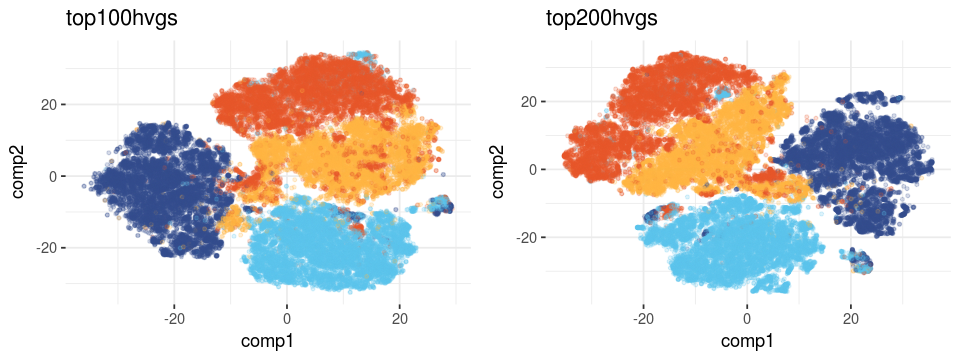

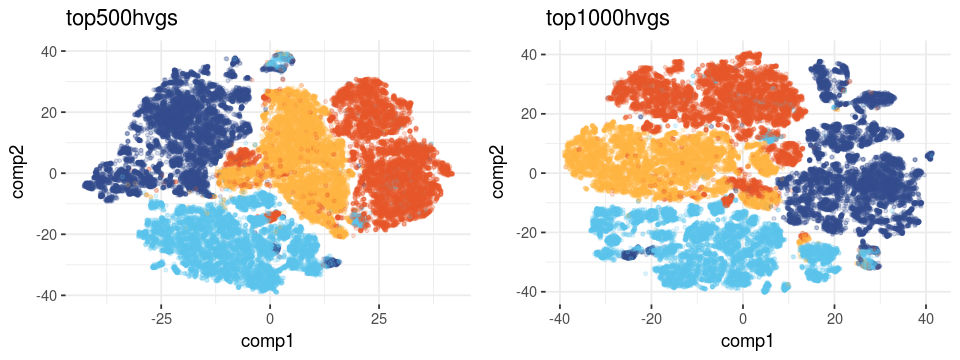

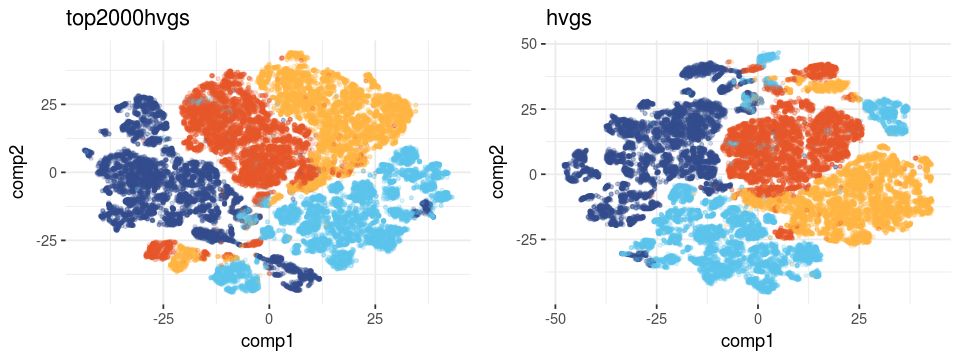

In [45]:
p1 = plot_tsne_day(tsne.100hvgs, sce[rowData(sce)$is_intop100hvg,]) + ggtitle("top100hvgs")
p2 = plot_tsne_day(tsne.200hvgs, sce[rowData(sce)$is_intop200hvg,]) + ggtitle("top200hvgs")
options(repr.plot.width = 8, repr.plot.height = 3)
plot_grid(p1, p2, ncol = 2)
p1 = plot_tsne_day(tsne.500hvgs, sce[rowData(sce)$is_intop500hvg,]) + ggtitle("top500hvgs")
p2 = plot_tsne_day(tsne.1000hvgs, sce[rowData(sce)$is_intop1000hvg,]) + ggtitle("top1000hvgs")
plot_grid(p1, p2, ncol = 2)
p1 = plot_tsne_day(tsne.2000hvgs, sce[rowData(sce)$is_intop2000hvg,]) + ggtitle("top2000hvgs")
p2 = plot_tsne_day(tsne.hvgs, sce[rowData(sce)$is_hvg,]) + ggtitle("hvgs")
plot_grid(p1, p2, ncol = 2)

In [56]:
library(RColorBrewer)

In [18]:
col_list = c(brewer.pal(8,"Set1"), brewer.pal(8,"Set2"), brewer.pal(12,"Set3"), brewer.pal(12,"Paired"),
             brewer.pal(9,"Pastel1"), brewer.pal(8,"Pastel2"), brewer.pal(8,"Dark2"), brewer.pal(8,"Accent"))

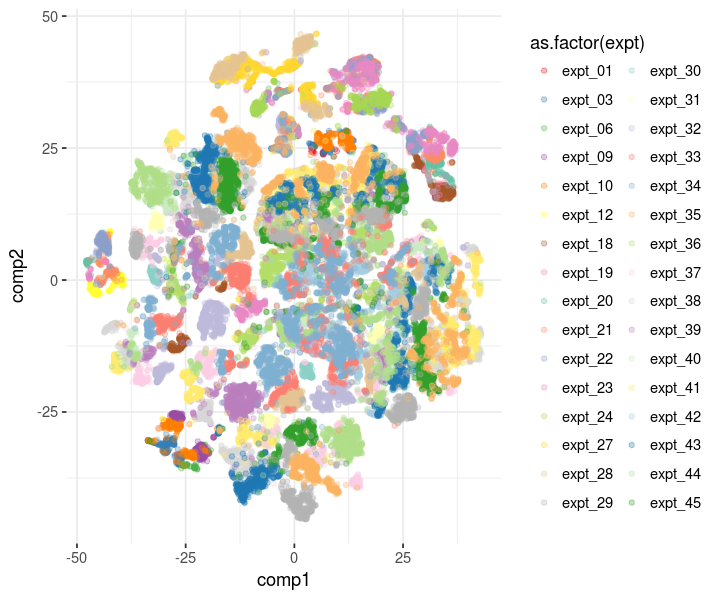

In [25]:
mytsne = tsne.hvgs
mysce = sce[rowData(sce)$is_hvg,]
df = data.frame(comp1 = mytsne$Y[,1], comp2 = mytsne$Y[,2], day = mysce$day, expt = mysce$experiment)
p = ggplot(df, aes(x = comp1, y = comp2, colour = as.factor(expt)))
p = p + geom_point(alpha = 0.3, size = 1.2) 
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + scale_colour_manual(values = col_list)
options(repr.plot.width = 6, repr.plot.height = 5)
p

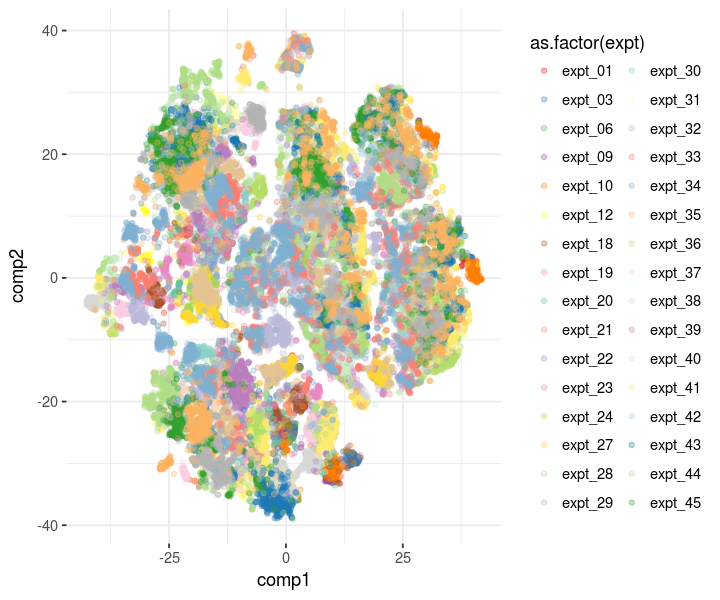

In [24]:
mytsne = tsne.500hvgs
mysce = sce[rowData(sce)$is_top500hvgs,]
df = data.frame(comp1 = mytsne$Y[,1], comp2 = mytsne$Y[,2], day = mysce$day, expt = mysce$experiment)
p = ggplot(df, aes(x = comp1, y = comp2, colour = as.factor(expt)))
p = p + geom_point(alpha = 0.3, size = 1.2) 
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + scale_colour_manual(values = col_list)
options(repr.plot.width = 6, repr.plot.height = 5)
p

In [19]:
data = logcounts(sce[rowData(sce)$is_intop500hvg,])
data[1:5,1:5]

,20416_1#10,20416_1#11,20416_1#112,20416_1#117,20416_1#118
ENSG00000002330_BAD,5.005142,5.683941,5.492199,4.694146,4.399928
ENSG00000002586_CD99,8.116213,7.414441,5.958647,6.838947,6.454728
ENSG00000003402_CFLAR,5.879361,6.693575,6.193865,2.196314,5.894462
ENSG00000006327_TNFRSF12A,0.000000,6.621135,5.689676,7.444439,6.781676
ENSG00000006625_GGCT,2.063989,6.772707,0.000000,5.339213,6.779922


In [33]:
install.packages("umap")

Warning message:
“package ‘umap’ is not available (for R version 3.4.3)”

In [22]:
?umap

In [1]:
coexpr_clusters_filename = "/nfs/leia/research/stegle/dseaton/hipsci/singlecell_endodiff/data/sce_merged_afterqc_filt_allexpts.PCA.cluster_means.tsv"

coexpr_clusters <- read.csv(coexpr_clusters_filename, row.names = 1, sep = "\t", header = T)
head(coexpr_clusters)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,X50,X51,X52,X53,X54,X55,X56,X57,X58,X59
21843_1#10,-2.96677786,-5.051700,2.557705,1.7846318,-3.8000932,2.7520889,0.04011419,-0.65210263,-2.4088645,-1.4745952,⋯,0.9746980,1.157624,1.0561422,0.6647575,1.0319868,0.9611851,1.1291618,1.1297945,1.105578,1.475525
21843_1#100,2.99582684,-9.416975,3.945243,4.6289860,-1.2671332,1.6378075,0.24622875,2.11823943,-0.1742999,-1.1184431,⋯,0.8779742,1.035389,0.7064237,0.7908379,0.9249539,0.9632030,0.9793299,0.9073227,1.006672,1.317119
21843_1#101,-0.08867775,-6.769028,5.613472,1.8904508,-1.3355565,0.6089684,0.80128325,0.42480083,1.0950508,1.1932872,⋯,0.9319036,1.083866,0.8746851,0.6844323,0.9858303,0.9590457,1.1212404,1.1387067,1.041555,1.390104
21843_1#102,-5.00171746,-4.727163,2.400886,2.0255520,-2.0095244,5.2201763,1.46083794,-1.89020695,-0.4836101,0.6099583,⋯,0.9637354,1.166783,1.0856965,0.5970522,1.0349560,0.8610726,1.1574574,1.1208192,1.088636,1.499318
21843_1#103,-2.08193872,-6.209893,4.675325,0.5933318,-0.6481828,3.4695832,-0.36674697,-0.72786039,-0.6366988,0.3395057,⋯,1.0077623,1.192433,1.0881635,0.6984261,0.9993791,0.9143417,1.0999614,1.0552629,1.053882,1.557355
21843_1#105,-0.71012454,-6.392112,4.809889,0.5048616,-0.4834257,1.2074208,3.08038259,0.05347892,-1.7887607,-2.4269346,⋯,0.9450494,1.060659,1.0799314,0.8152264,0.9843815,0.9029240,1.0742548,1.1586082,1.167950,1.494102


In [4]:
# head(logcounts(sce)[,order(colnames(sce))])

In [15]:
rm(list = ls())

In [4]:
sce.file = "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_filt_allexpts.rds"
sce = readRDS(sce.file)

In [9]:
sce

class: SingleCellExperiment 
dim: 11231 36044 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(36044): 21843_1#10 21843_1#100 ... 24539_8#97 24539_8#98
colData names(116): adj_x adj_y ... cell_cycle_seurat pseudo
reducedDimNames(1): PCA
spikeNames(1): ERCC

In [10]:
df = coexpr_clusters[,c("PC1","X0","X6","X10","X28","X30","X59")]
colnames(df) <- c("PC1","Respiration","Pseudotime","G1S","Steroid biosynthesis","G2M","Mesendo")
head(df)

,PC1,Respiration,Pseudotime,G1S,Steroid biosynthesis,G2M,Mesendo
21843_1#10,-2.96677786,0.9506107,0.8021647,1.3079133,1.1879327,0.9804564,1.475525
21843_1#100,2.99582684,0.7646530,1.1990911,0.9603342,1.1394999,0.8183022,1.317119
21843_1#101,-0.08867775,0.9148825,1.1474366,1.1988545,1.1249353,1.0498981,1.390104
21843_1#102,-5.00171746,0.9706187,0.6160143,1.2516562,0.9772479,1.0277045,1.499318
21843_1#103,-2.08193872,0.9026089,1.0055328,1.0790725,1.2640810,0.9914854,1.557355
21843_1#105,-0.71012454,0.9603241,1.0035752,1.0907819,1.2815363,1.1812854,1.494102


In [ ]:
genes_clusters_filename <- "/nfs/leia/research/stegle/dseaton/hipsci/singlecell_endodiff/data/clustering/sce_merged_afterqc_filt_allexpts_exprs_20180618/cluster.tsv"
genes_clusters = as.data.frame(read.csv(genes_clusters_filename, sep = "\t"))
colnames(genes_clusters)[1] <- "gene"
head(genes_clusters)

In [21]:
Respiration_genes = genes_clusters[genes_clusters$cluster_label == 0,"gene"]

In [23]:
Respiration_genes[order(Respiration_genes)]

[1] "AASDH"     "ACOT13"    "ACOT8"     "ANAPC16"   "ARL6IP5"   "ASCC3"    
  [7] "ATP5I"     "ATP5O"     "ATPIF1"    "B9D1"      "BEX1"      "BEX2"     
 [13] "BOLA1"     "C10orf118" "C11orf1"   "C11orf71"  "C19orf82"  "CAMTA1"   
 [19] "CCDC152"   "CCDC24"    "CCDC25"    "CHCHD6"    "CHURC1"    "CLEC11A"  
 [25] "CNFN"      "CNIH4"     "COX5A"     "COX5B"     "COX7C"     "CSTB"     
 [31] "CUTA"      "DHRS1"     "DHRS4"     "DHRS4L2"   "DLG3"      "DMKN"     
 [37] "DUSP23"    "EHMT1"     "EIF2D"     "FAM217B"   "FBXL15"    "GALK1"    
 [43] "GCHFR"     "GCSH"      "H2AFJ"     "HCFC1R1"   "HINT1"     "HIST1H4J" 
 [49] "HLTF"      "HSBP1"     "IMMP1L"    "LARP7"     "LDOC1"     "MGST3"    
 [55] "MIF4GD"    "MNAT1"     "MPHOSPH8"  "MRP63"     "MTIF3"     "NDUFA4"   
 [61] "NDUFB1"    "NDUFB4"    "NDUFB8"    "NDUFC1"    "NDUFS5"    "NDUFV2P1" 
 [67] "NME3"      "NR1H3"     "NSMCE1"    "NUDT14"    "OXLD1"     "PAFAH1B3" 
 [73] "PARP1"     "PEX16"     "PMS2P1"    "PNKD"      "POLR2I"    "PRDX2"    
 [79] "PSME1"     "RAB13"     "RFXANK"    "RHOH"      "RNMT"      "RPS27L"   
 [85] "RSF1"      "SERF1B"    "SEZ6L2"    "SIGIRR"    "SLC27A5"   "TCEAL4"   
 [91] "THAP8"     "TMEM261"   "TMEM42"    "TMEM80"    "TNRC6A"    "TOMM7"    
 [97] "TSTD1"     "TXNDC17"   "UFC1"      "UPF2"      "UQCR10"    "UQCRB"    
[103] "WASL"      "WDR54"     "WDR83"     "WFDC2"     "XRCC6BP1"  "YIPF2"    
[109] "ZNF514"    "ZSWIM7"

In [30]:
df = data.frame(Pseudotime = coexpr_clusters$PC1, G1S = coexpr_clusters$X10, Respiration = coexpr_clusters$X0, gene = t(logcounts(sce[rowData(sce)$hgnc_symbol == "TP53",])))

In [31]:
head(df)

,Pseudotime,G1S,Respiration,ENSG00000141510_TP53
21843_1#10,-2.96677786,1.3079133,0.9506107,4.783783
21843_1#100,2.99582684,0.9603342,0.7646530,5.024080
21843_1#101,-0.08867775,1.1988545,0.9148825,3.351021
21843_1#102,-5.00171746,1.2516562,0.9706187,1.303856
21843_1#103,-2.08193872,1.0790725,0.9026089,1.933300
21843_1#105,-0.71012454,1.0907819,0.9603241,4.922786


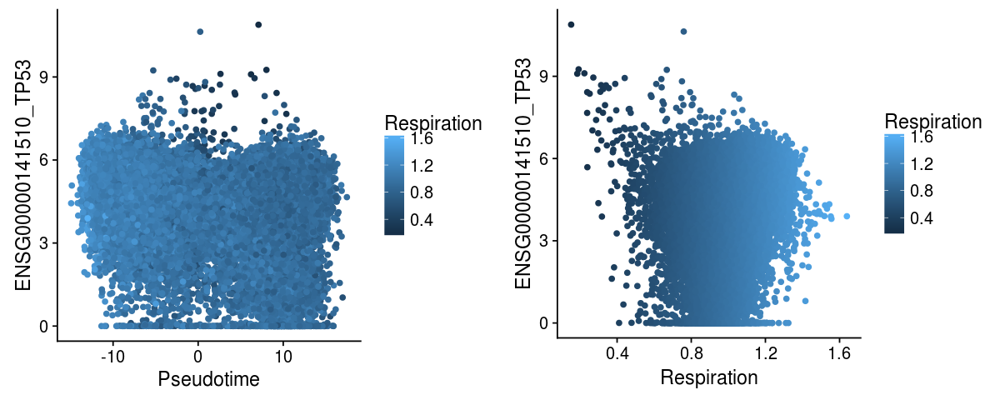

In [33]:
p1 = ggplot(df, aes(x = Pseudotime, y = ENSG00000141510_TP53, colour = Respiration)) + geom_point()
p2 = ggplot(df, aes(x = Respiration, y = ENSG00000141510_TP53, colour = Respiration)) + geom_point()
options(repr.plot.width = 10, repr.plot.height = 4)
plot_grid(p1, p2, ncol = 2)

In [12]:
G1S_genes = genes_clusters[genes_clusters$cluster_label == 10,"gene"]
G2M_genes = genes_clusters[genes_clusters$cluster_label == 30,"gene"]

In [24]:
G1S_genes[order(G1S_genes)]

[1] "AEN"      "ARHGEF26" "ATAD2"    "C19orf48" "C3orf14"  "CCNE1"   
 [7] "CDC6"     "CDCA7"    "CHAF1A"   "CHAF1B"   "DDX11"    "DGCR8"   
[13] "DTL"      "E2F1"     "EMC3-AS1" "FAM111B"  "GINS2"    "GPD2"    
[19] "GUCD1"    "HELLS"    "KANK2"    "LIMK2"    "MCM10"    "MCM2"    
[25] "MCM3"     "MCM4"     "MCM5"     "MCM6"     "MCM7"     "MTHFD1"  
[31] "NPAT"     "PASK"     "PCNA"     "POLA1"    "POLD3"    "PPAT"    
[37] "RAD51D"   "RBBP8"    "RFC2"     "RFWD3"    "RNF168"   "SLC1A5"  
[43] "SMYD4"    "SSH2"     "TOP3A"    "TOR3A"    "TRMT2A"   "UNG"     
[49] "USP37"    "WDHD1"    "WDR76"    "XRCC2"    "XRCC3"    "ZNF100"

In [14]:
G2M_genes[order(G2M_genes)]

[1] "GOLPH3L"  "CKS1B"    "SAR1B"    "CDCA3"    "HMG20B"   "PARPBP"  
  [7] "MSL3P1"   "PHACTR4"  "ZMAT5"    "CALM2"    "OIP5"     "COIL"    
 [13] "SRSF3"    "CHEK2"    "AKIRIN2"  "HN1"      "WRAP53"   "DNAJC17" 
 [19] "KIAA0586" "CCNH"     "NCOR1"    "KLHDC9"   "CUTC"     "TUBB4B"  
 [25] "PSTK"     "FAM64A"   "LRIF1"    "FAM216A"  "TUBD1"    "TMEM60"  
 [31] "MRPS31"   "COQ7"     "RANGAP1"  "CDC27"    "BRE"      "POLG2"   
 [37] "POP4"     "PTTG1"    "CCNA2"    "HYLS1"    "NEK3"     "BUB3"    
 [43] "NUDCD2"   "TMEM138"  "DUSP11"   "CCNB2"    "CCNB1"    "CSTF1"   
 [49] "COQ3"     "GOT1"     "KIF22"    "XRCC4"    "THUMPD1"  "NIF3L1"  
 [55] "PLK1"     "DOLPP1"   "TMEM99"   "CLPB"     "DMAP1"    "HMMR"    
 [61] "PAFAH2"   "SPDL1"    "TRIM59"   "DBF4"     "TRDMT1"   "CKS2"    
 [67] "ERCC4"    "GNB1L"    "FAM192A"  "CYB561D2" "COPS7A"   "POC1A"   
 [73] "SMTN"     "C2orf76"  "INO80C"   "OSGEPL1"  "ZC3HC1"   "TDP1"    
 [79] "TAF8"     "CD58"     "C1orf174" "SEC22C"   "CTH"      "MED7"    
 [85] "MED8"     "CEP70"    "ZFX"      "BNIP1"    "ZC3H7A"   "TROAP"   
 [91] "SCLT1"    "KIF20A"   "TRAF2"    "METTL10"  "DEPDC1B"  "ENOX2"   
 [97] "CDC20"    "ING3"     "CEP41"    "PRPSAP1"  "NUP35"    "KATNA1"  
[103] "KPNA2"    "KNSTRN"   "RBMX"     "NSMCE4A"  "PSRC1"    "DZIP3"   
[109] "LIPT2"    "CEP63"    "KAT5"     "FBXL5"    "DPAGT1"   "RAB8A"   
[115] "HSPA2"    "GABPB1"   "FAM83D"   "TMEM106C" "NEK2"     "TXNDC15" 
[121] "TTI2"     "CEP76"    "ZNF771"   "EMC9"     "METTL18"  "PLA2G15" 
[127] "MTFMT"    "NDE1"     "DDX39A"   "CENPT"    "CRADD"    "INTS12"  
[133] "CEP250"   "LOH12CR1" "UIMC1"    "DNAH14"   "BORA"     "MIIP"    
[139] "PPIE"     "SPOP"     "ADD3"     "C17orf75" "GEMIN8"   "IFT74"   
[145] "RNF26"    "SNUPN"    "ZNF16"    "COPS7B"   "UBE2G1"   "MED21"   
[151] "CDKN3"    "IMMP2L"   "FAM110A"  "MKNK1"    "RHEB"     "MZT1"    
[157] "FOPNL"    "DDX10"

In [15]:
cc_genes <- c(G1S_genes, G2M_genes)

In [16]:
pc_cc <- prcomp(t(logcounts(sce)[rowData(sce)$hgnc_symbol %in% cc_genes,]))

In [17]:
df = as.data.frame(cbind(pc_cc$x[,1:4], coexpr_clusters[,c("X10","X30")]))
colnames(df) <- c("PC1","PC2","PC3","PC4","G1S","G2M")
perc_var <- round(summary(pc_cc)$importance[2,]*100, 1)
options(repr.plot.width = 6, repr.plot.height = 4)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = G1S)) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9)) +
        theme_bw() + theme(panel.border = element_blank()) 
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
p1 = p
p = ggplot(df, aes(x = as.numeric(PC3), y = as.numeric(PC4), colour = G1S)) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9)) +
        theme_bw() + theme(panel.border = element_blank()) 
p = p + xlab(paste0("PC3, ",perc_var[3],"% variance explained")) 
p = p + ylab(paste0("PC4, ",perc_var[4],"% variance explained"))
p2 = p

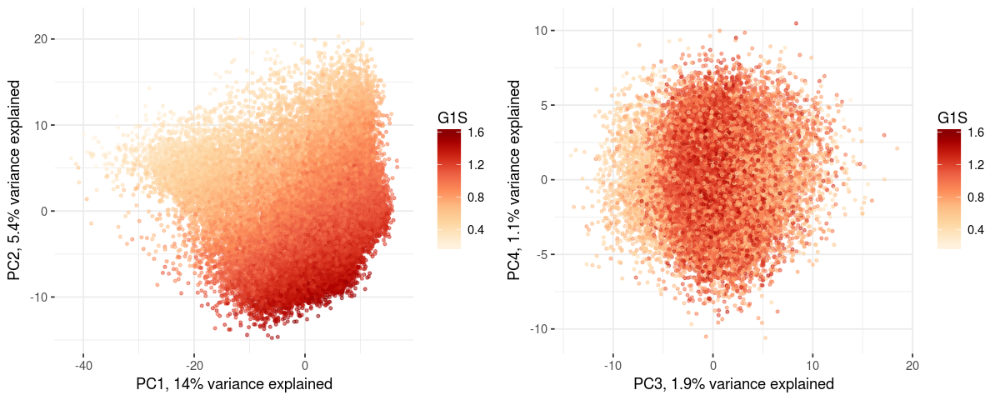

In [18]:
options(repr.plot.width = 10, repr.plot.height = 4)
plot_grid(p1, p2, ncol = 2)

In [19]:
df = as.data.frame(cbind(pc_cc$x[,1:4], coexpr_clusters[,c("X10","X39")]))
colnames(df) <- c("PC1","PC2","PC3","PC4","G1S","G2M")
perc_var <- round(summary(pc_cc)$importance[2,]*100, 1)
options(repr.plot.width = 6, repr.plot.height = 4)
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = G2M)) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) +
        theme_bw() + theme(panel.border = element_blank()) 
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC2, ",perc_var[2],"% variance explained"))
p1 = p
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC3), colour = G2M)) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) +
        theme_bw() + theme(panel.border = element_blank()) 
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC3, ",perc_var[3],"% variance explained"))
p2 = p
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC4), colour = G2M)) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) +
        theme_bw() + theme(panel.border = element_blank()) 
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC4, ",perc_var[4],"% variance explained"))
p3 = p
p = ggplot(df, aes(x = as.numeric(PC2), y = as.numeric(PC3), colour = G2M)) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) +
        theme_bw() + theme(panel.border = element_blank()) 
p = p + xlab(paste0("PC2, ",perc_var[2],"% variance explained")) 
p = p + ylab(paste0("PC3, ",perc_var[3],"% variance explained"))
p4 = p
p = ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC4), colour = G2M)) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) +
        theme_bw() + theme(panel.border = element_blank()) 
p = p + xlab(paste0("PC1, ",perc_var[1],"% variance explained")) 
p = p + ylab(paste0("PC4, ",perc_var[4],"% variance explained"))
p5 = p
p = ggplot(df, aes(x = as.numeric(PC2), y = as.numeric(PC4), colour = G2M)) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) +
        theme_bw() + theme(panel.border = element_blank()) 
p = p + xlab(paste0("PC2, ",perc_var[2],"% variance explained")) 
p = p + ylab(paste0("PC4, ",perc_var[4],"% variance explained"))
p6 = p
p = ggplot(df, aes(x = as.numeric(PC3), y = as.numeric(PC4), colour = G2M)) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9)) +
        theme_bw() + theme(panel.border = element_blank()) 
p = p + xlab(paste0("PC3, ",perc_var[3],"% variance explained")) 
p = p + ylab(paste0("PC4, ",perc_var[4],"% variance explained"))
p7 = p

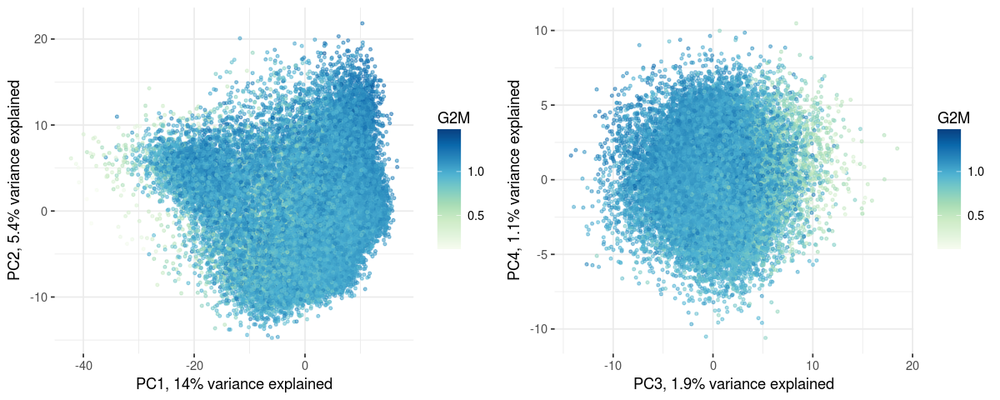

In [20]:
options(repr.plot.width = 10, repr.plot.height = 4)
plot_grid(p1, p7, ncol = 2)

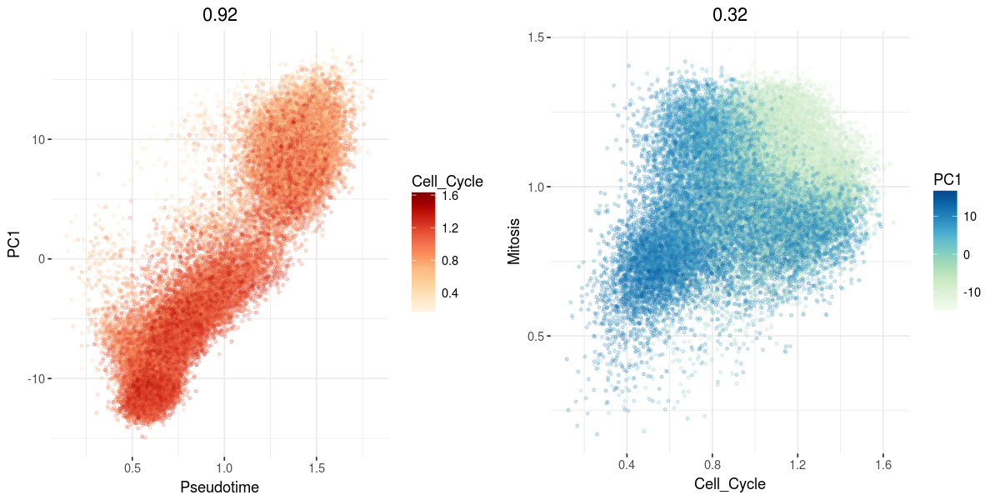

In [58]:
p = ggplot(df, aes(x = Pseudotime, y = PC1, colour = Cell_Cycle)) 
p = p + geom_point(alpha = 0.2, size = 0.8) + scale_colour_gradientn(colors = brewer.pal("OrRd",n = 9))
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + ggtitle(round(cor(df$Pseudotime, df$PC1),digits = 2)) + theme(plot.title = element_text(hjust = 0.5))
p1 = p
p = ggplot(df, aes(x = Cell_Cycle, y = Mitosis, colour = PC1)) 
p = p + geom_point(alpha = 0.2, size = 0.8) + scale_colour_gradientn(colors = brewer.pal("GnBu",n = 9))
p = p + theme_bw() + theme(panel.border = element_blank())
p = p + ggtitle(round(cor(df$Cell_Cycle, df$Mitosis),digits = 2)) + theme(plot.title = element_text(hjust = 0.5))
p2 = p
options(repr.plot.width = 10, repr.plot.height = 5)
plot_grid(p1, p2, ncol = 2)

In [4]:
cell_cycle <- read.csv("/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/scQTLs/cell_cycle_annos_afterfilt.csv", row.names = 1)

In [5]:
head(cell_cycle)

,nGene,nUMI,orig.ident,S.Score,G2M.Score,Phase,old.ident
21843_1#10,8924,594038.6,21843,0.211096707,-0.041512138,S,21843
21843_1#100,7841,220225.7,21843,0.057183167,-0.006917689,S,21843
21843_1#101,8743,578606.4,21843,0.012879229,0.032335921,G2M,21843
21843_1#102,8804,473281.6,21843,0.165563391,-0.132369652,S,21843
21843_1#103,8919,401529.3,21843,0.125968156,-0.103761495,S,21843
21843_1#105,9232,359095.5,21843,0.001511992,0.196756536,G2M,21843


In [25]:
colData(sce)$cell_cycle_seurat <- cell_cycle

In [29]:
sce.file = "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/merged/20180618/sce_merged_afterqc_filt_allexpts.rds"
saveRDS(sce, sce.file)

In [7]:
# Also read in a list of cell cycle markers, from Tirosh et al, 2015
cc.genes <- readLines(con = "/hps/nobackup/stegle/users/acuomo/regev_lab_cell_cycle_genes.txt")

In [8]:
names(rowData(sce))

[1] "exprs_collapsed_to"    "ensembl_transcript_id" "ensembl_gene_id"      
 [4] "hgnc_symbol"           "chromosome_name"       "start_position"       
 [7] "end_position"          "gene_biotype"          "feature_symbol"       
[10] "feature_id"            "is_feature_control"

In [9]:
sce.cc <- sce[rowData(sce)$hgnc_symbol %in% cc.genes,]

In [10]:
pca.cc <- prcomp(t(logcounts(sce.cc)))

In [16]:
df = as.data.frame(cbind(pca.cc$x[,1:2],cell_cycle))

In [17]:
head(df)

,PC1,PC2,nGene,nUMI,orig.ident,S.Score,G2M.Score,Phase,old.ident
21843_1#10,3.3578048,-6.5361166,8924,594038.6,21843,0.211096707,-0.041512138,S,21843
21843_1#100,-1.6369003,1.2756837,7841,220225.7,21843,0.057183167,-0.006917689,S,21843
21843_1#101,3.8079735,-0.3210799,8743,578606.4,21843,0.012879229,0.032335921,G2M,21843
21843_1#102,1.2126375,-6.0819528,8804,473281.6,21843,0.165563391,-0.132369652,S,21843
21843_1#103,0.7265133,-3.9633355,8919,401529.3,21843,0.125968156,-0.103761495,S,21843
21843_1#105,7.5343966,1.0079610,9232,359095.5,21843,0.001511992,0.196756536,G2M,21843


In [13]:
# df = cell_cycle
# nrow(df)
# nrow(df[df$Phase == "G1",])
# nrow(df[df$Phase == "G2M",])
# nrow(df[df$Phase == "S",])

[1] 36044

[1] 7490

[1] 13679

[1] 14875

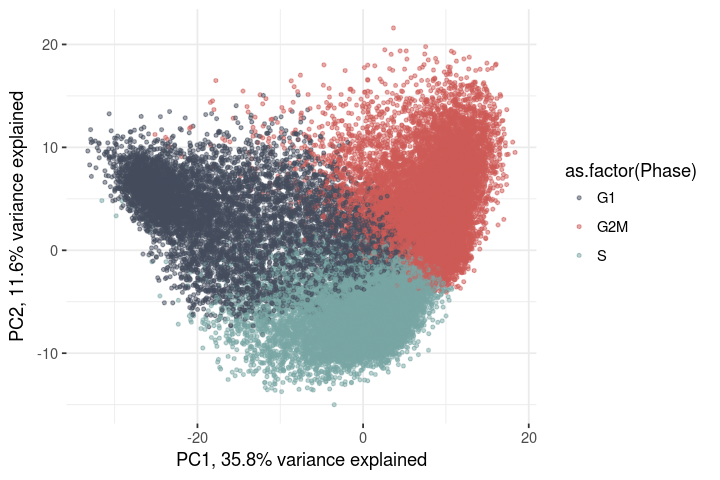

In [18]:
perc_var <- round(summary(pca.cc)$importance[2,]*100, 1)
options(repr.plot.width = 6, repr.plot.height = 4)
colnames(df)[3] <- "day"
ggplot(df, aes(x = as.numeric(PC1), y = as.numeric(PC2), colour = as.factor(Phase))) + 
        geom_point(alpha = 0.5, size = 0.8) + 
        scale_color_canva(palette = "Warm and cool") +
        theme_bw() + theme(panel.border = element_blank()) + 
        xlab(paste0("PC1, ",perc_var[1],"% variance explained")) +
        ylab(paste0("PC2, ",perc_var[2],"% variance explained"))

In [56]:
sce

class: SingleCellExperiment 
dim: 11231 36044 
metadata(4): log.exprs.offset log.exprs.offset log.exprs.offset
  log.exprs.offset
assays(3): tpm counts logcounts
rownames(11231): ENSG00000000003_TSPAN6 ENSG00000000419_DPM1 ...
  ENSG00000272325_NUDT3 ENSG00000272398_CD24
rowData names(11): exprs_collapsed_to ensembl_transcript_id ...
  feature_id is_feature_control
colnames(36044): 21843_1#10 21843_1#100 ... 24539_8#97 24539_8#98
colData names(116): adj_x adj_y ... cell_cycle_seurat pseudo
reducedDimNames(1): PCA
spikeNames(1): ERCC

In [57]:
sce0 = sce[,sce$day == "day0"]

In [58]:
library(diptest)

In [59]:
tableSalmon <- logcounts(sce0)

In [61]:
SalmonDipTest <- NULL
for(i in 1:nrow(logcounts(sce0))){
   expressionS <- as.numeric(tableSalmon[i,])
   SalmonDipTest <- c(SalmonDipTest,dip(expressionS))
}
names(SalmonDipTest) <- rownames(tableSalmon)

In [65]:
write.table(SalmonDipTest, "/hps/nobackup/stegle/users/acuomo/salmon_diptest_day0_logcounts.tsv", row.names = T, col.names = F, quote = F)